# Bipartite Network: Companies and Investors

In [63]:
import pandas as pd
import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import seaborn as sns
import re
import string
from collections import Counter, defaultdict
import nltk
from nltk.corpus import stopwords
import math

## Load and Explore Data

In [2]:
# Load the data
df = pd.read_csv('anonymized_network_data.csv')
print(f"Total rows: {len(df)}")
print(f"\nColumns: {df.columns.tolist()}")
df.head()

Total rows: 62323

Columns: ['Deal ID', 'Companies', 'Company ID', 'Description_deal', 'Description_investor', 'Primary Industry Sector_deal', 'Primary Industry Group_deal', 'Primary Industry Code_deal', 'Keywords_deal', 'Investors', 'Lead/Sole Investors', 'Primary Investor Type', 'Preferred Industry']


,Deal ID,Companies,Company ID,Description_deal,Description_investor,Primary Industry Sector_deal,Primary Industry Group_deal,Primary Industry Code_deal,Keywords_deal,Investors,Lead/Sole Investors,Primary Investor Type,Preferred Industry
0,304086-16T,Horizon Drive,CID_00000,Developer of a global healthcare provider sear...,NaN,Healthcare,Healthcare Technology Systems,Other Healthcare Technology Systems,"comparison data, digital health solutions, doc...",Joseph Torres,0,NaN,NaN
1,303876-37T,Eco Modeling,CID_00001,Developer and manufacturer of semiconductor pr...,NaN,Information Technology,Semiconductors,Other Semiconductors,"circuit fabrication, processing equipment, sem...",John Wright,0,NaN,NaN
2,303464-53T,Meteor TechBase,CID_00002,Manufacturer of material technologies intended...,NaN,Business Products and Services (B2B),Commercial Products,Industrial Supplies and Parts,"composite manufacturers, composite materials, ...",Erik Magnussen,0,NaN,NaN
3,303125-86T,Blaze Science,CID_00003,Developer of large language models designed to...,NaN,Information Technology,Software,Software Development Applications,"ai capabilities, ai model, ai software develop...",Keith Miller,1,NaN,NaN
4,303116-68T,Bronze Soft,CID_00004,Provider of digital infrastructure tools desig...,NaN,Information Technology,Software,Business/Productivity Software,"asset management, content delivery, creative w...",Arvid Morris,0,NaN,NaN


In [3]:
# Check for missing values in key columns
print("Missing values in key columns:")
print(df[['Companies', 'Investors', 'Description_deal', 'Description_investor']].isnull().sum())

Missing values in key columns:
Companies                   0
Investors                   0
Description_deal            0
Description_investor    54233
dtype: int64


In [35]:
print("\nUnique Primary Industry Sector:", df['Primary Industry Sector_deal'].nunique())
print("\nUnique Primary Industry Group:", df['Primary Industry Group_deal'].nunique())
print("\nUnique Primary Industry Code:", df['Primary Industry Code_deal'].nunique())



Unique Primary Industry Sector: 7

Unique Primary Industry Group: 41

Unique Primary Industry Code: 199


## Prepare Node Attributes

In [4]:
# Prepare company attributes
company_attrs = df.groupby('Companies').agg({
    'Description_deal': 'first',
    'Primary Industry Sector_deal': 'first',
    'Primary Industry Group_deal': 'first',
    'Primary Industry Code_deal': 'first'
}).to_dict('index')

print(f"Number of unique companies: {len(company_attrs)}")

Number of unique companies: 13614


In [5]:
# Prepare investor attributes
investor_attrs = df.groupby('Investors').agg({
    'Description_investor': 'first',
    'Lead/Sole Investors': 'sum',  # Sum of lead/sole investments
    'Primary Investor Type': 'first',
    'Preferred Industry': 'first'
}).to_dict('index')

print(f"Number of unique investors: {len(investor_attrs)}")

Number of unique investors: 31753


## Build Bipartite Network

In [6]:
# Create bipartite graph
B = nx.Graph()

# Add company nodes with attributes
for company, attrs in company_attrs.items():
    B.add_node(company, 
               bipartite=0,  # Companies are in set 0
               node_type='company',
               description=attrs['Description_deal'],
               sector=attrs['Primary Industry Sector_deal'],
               industry_group=attrs['Primary Industry Group_deal'],
               industry_code=attrs['Primary Industry Code_deal'])

# Add investor nodes with attributes
for investor, attrs in investor_attrs.items():
    B.add_node(investor,
               bipartite=1,  # Investors are in set 1
               node_type='investor',
               description=attrs['Description_investor'],
               lead_sole_count=attrs['Lead/Sole Investors'],
               investor_type=attrs['Primary Investor Type'],
               preferred_industry=attrs['Preferred Industry'])

print(f"Total nodes: {B.number_of_nodes()}")
print(f"Companies: {len(company_attrs)}")
print(f"Investors: {len(investor_attrs)}")

Total nodes: 45367
Companies: 13614
Investors: 31753


In [7]:
# Count investments (edges with weights)
edge_weights = df.groupby(['Companies', 'Investors']).size().reset_index(name='weight')

# Add weighted edges
for _, row in edge_weights.iterrows():
    B.add_edge(row['Companies'], row['Investors'], weight=row['weight'])

print(f"Total edges: {B.number_of_edges()}")
print(f"\nEdge weight statistics:")
print(edge_weights['weight'].describe())

Total edges: 57395

Edge weight statistics:
count    57395.000000
mean         1.085861
std          0.304594
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          5.000000
Name: weight, dtype: float64


## Verify Bipartite Structure

In [8]:
# Verify it's bipartite
print(f"Is bipartite: {bipartite.is_bipartite(B)}")

# Get the two sets
companies = {n for n, d in B.nodes(data=True) if d['bipartite'] == 0}
investors = {n for n, d in B.nodes(data=True) if d['bipartite'] == 1}

print(f"\nCompany nodes: {len(companies)}")
print(f"Investor nodes: {len(investors)}")

Is bipartite: True

Company nodes: 13614
Investor nodes: 31753


## Network Statistics

In [9]:
# Basic statistics
print("Network Statistics:")
print(f"Number of nodes: {B.number_of_nodes()}")
print(f"Number of edges: {B.number_of_edges()}")
print(f"Density: {nx.density(B):.6f}")
print(f"\nConnected components: {nx.number_connected_components(B)}")

Network Statistics:
Number of nodes: 45367
Number of edges: 57395
Density: 0.000056

Connected components: 3132


In [10]:
# Degree statistics
company_degrees = [B.degree(n) for n in companies]
investor_degrees = [B.degree(n) for n in investors]

print("\nCompany degree statistics (number of investors):")
print(f"Mean: {np.mean(company_degrees):.2f}")
print(f"Median: {np.median(company_degrees):.2f}")
print(f"Max: {np.max(company_degrees)}")
print(f"Min: {np.min(company_degrees)}")

print("\nInvestor degree statistics (number of companies invested in):")
print(f"Mean: {np.mean(investor_degrees):.2f}")
print(f"Median: {np.median(investor_degrees):.2f}")
print(f"Max: {np.max(investor_degrees)}")
print(f"Min: {np.min(investor_degrees)}")


Company degree statistics (number of investors):
Mean: 4.22
Median: 3.00
Max: 128
Min: 1

Investor degree statistics (number of companies invested in):
Mean: 1.81
Median: 1.00
Max: 245
Min: 1


In [11]:
# Top companies by number of investors
top_companies = sorted([(n, B.degree(n)) for n in companies], key=lambda x: x[1], reverse=True)[:10]
print("\nTop 10 companies by number of investors:")
for company, degree in top_companies:
    print(f"{company}: {degree} investors")


Top 10 companies by number of investors:
Zen Industries: 128 investors
Vita Future: 63 investors
Orbit District: 60 investors
ZenCore Partners: 53 investors
Inter SolutionsLab: 46 investors
Vanguardis Resources: 46 investors
Orion Comet: 45 investors
Aqua PowerGrid: 44 investors
Turbo Storm: 43 investors
Glide Terrain: 43 investors


In [12]:
# Top investors by number of companies
top_investors = sorted([(n, B.degree(n)) for n in investors], key=lambda x: x[1], reverse=True)[:10]
print("\nTop 10 investors by number of companies:")
for investor, degree in top_investors:
    print(f"{investor}: {degree} companies")


Top 10 investors by number of companies:
Patrick Brooks: 245 companies
Ronald Papadakis: 206 companies
Gabriel Henderson: 185 companies
Kent Dragomir: 155 companies
Tristan Weber: 114 companies
Spencer Perry: 106 companies
Robertson Reed: 104 companies
Jeffrey Ward: 92 companies
Scott Walton: 87 companies
Dylan Galanis: 85 companies


## Visualize Sample Subgraph

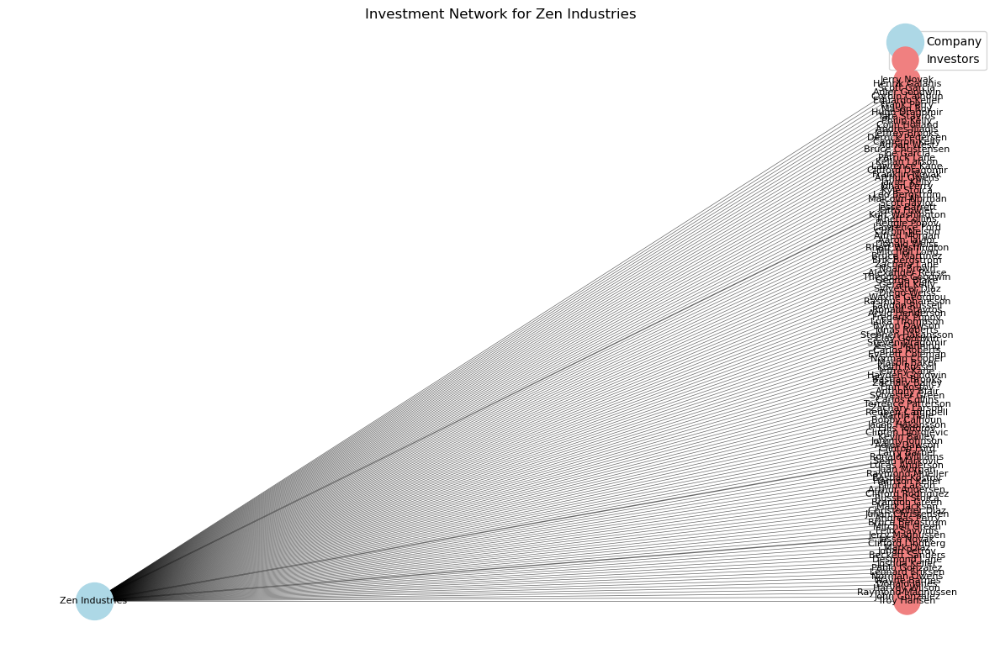

In [13]:
# Visualize a small subgraph (top company and its investors)
if top_companies:
    top_company = top_companies[0][0]
    
    # Get neighbors (investors) of top company
    neighbors = list(B.neighbors(top_company))
    
    # Create subgraph
    subgraph_nodes = [top_company] + neighbors
    subgraph = B.subgraph(subgraph_nodes)
    
    # Create layout
    pos = nx.bipartite_layout(subgraph, [top_company])
    
    # Draw
    plt.figure(figsize=(12, 8))
    
    # Draw company node
    nx.draw_networkx_nodes(subgraph, pos, nodelist=[top_company], 
                          node_color='lightblue', node_size=1000, label='Company')
    
    # Draw investor nodes
    nx.draw_networkx_nodes(subgraph, pos, nodelist=neighbors,
                          node_color='lightcoral', node_size=500, label='Investors')
    
    # Draw edges with weights
    edges = subgraph.edges()
    weights = [subgraph[u][v]['weight'] for u, v in edges]
    nx.draw_networkx_edges(subgraph, pos, width=[w*0.5 for w in weights], alpha=0.6)
    
    # Draw labels
    nx.draw_networkx_labels(subgraph, pos, font_size=8)
    
    plt.title(f"Investment Network for {top_company}")
    plt.legend()
    plt.axis('off')
    plt.tight_layout()
    plt.show()

## Save Network

In [14]:
# Save the network
# Convert None values to empty strings for GEXF compatibility
for node, data in B.nodes(data=True):
    for key, value in data.items():
        if value is None:
            B.nodes[node][key] = ""

nx.write_gexf(B, 'bipartite_network.gexf')
print("Network saved as 'bipartite_network.gexf'")

Network saved as 'bipartite_network.gexf'


## Access Node Attributes Example

In [15]:
# Example: Access attributes of a specific company
if top_companies:
    example_company = top_companies[0][0]
    print(f"Attributes for {example_company}:")
    for key, value in B.nodes[example_company].items():
        print(f"  {key}: {value}")

Attributes for Zen Industries:
  bipartite: 0
  node_type: company
  description: Developer of a decentralized blockchain infrastructure protocol designed for interoperability and scalability across multiple blockchain networks. The company's platform enables independent blockchains to exchange data and assets securely through a shared relay chain, supports custom blockchain development via modular frameworks, enabling developers to build and operate interconnected blockchain ecosystems with enhanced security, flexibility, and coordination.
  sector: Information Technology
  industry_group: Software
  industry_code: Software Development Applications


In [16]:
# Example: Access attributes of a specific investor
if top_investors:
    example_investor = top_investors[0][0]
    print(f"\nAttributes for {example_investor}:")
    for key, value in B.nodes[example_investor].items():
        print(f"  {key}: {value}")


Attributes for Patrick Brooks:
  bipartite: 1
  node_type: investor
  description: Founded in 2006, Patrick Brooks is an accelerator/incubator based in Sunnyvale, California. The firm prefers to invest in companies operating in advanced manufacturing, aerospace and defense, agricultural technology, animal health, brand and retail, cryptocurrency and digital assets, deep technology, energy, enterprise and artificial intelligence, financial technology, food and beverage, global overseas acceleration and learning, health, insurance technology, maritime, media and advertising, medical technology, mobility, new materials and packaging, real estate and construction, semiconductors, smart cities, sports technology, supply chain and logistics, sustainability, and travel and hospitality sectors. The firm also makes venture capital investments.
  lead_sole_count: 4
  investor_type: Accelerator/Incubator
  preferred_industry: Aerospace and Defense, Animal Husbandry, Aquaculture, Beverages, Commu

# Investor-Investor Network

Create a network where investors are connected based on co-investments.

- Two investors get connected if they both invested in the same company(s)
- Edge weight = number of companies they both invested in (co-investments)


## Create the network

In [17]:
# Create investor-investor network using bipartite projection
from networkx.algorithms import bipartite

# Get investor nodes
investor_nodes = {n for n, d in B.nodes(data=True) if d['bipartite'] == 1}

# Create weighted projection
I = bipartite.weighted_projected_graph(B, investor_nodes)

print(f"Investor network: {I.number_of_nodes()} nodes, {I.number_of_edges()} edges")

Investor network: 31753 nodes, 231006 edges


In [18]:
# Normalize weights to [0, 1]
weights = [I[u][v]['weight'] for u, v in I.edges()]

if weights:
    min_w, max_w = min(weights), max(weights)
    print(f"Weight range: [{min_w}, {max_w}]")
    
    if max_w > min_w:
        for u, v in I.edges():
            I[u][v]['normalized_weight'] = (I[u][v]['weight'] - min_w) / (max_w - min_w)
    else:
        for u, v in I.edges():
            I[u][v]['normalized_weight'] = 1.0
    
    norm_weights = [I[u][v]['normalized_weight'] for u, v in I.edges()]
    print(f"Normalized: [{min(norm_weights):.3f}, {max(norm_weights):.3f}]")

Weight range: [1, 22]
Normalized: [0.000, 1.000]


In [19]:
# Save investor network
for node, data in I.nodes(data=True):
    for key, value in data.items():
        if value is None:
            I.nodes[node][key] = ""

nx.write_gexf(I, 'investor_network.gexf')
print("Saved as 'investor_network.gexf'")

Saved as 'investor_network.gexf'


## Visualize the network

In [20]:
I = nx.read_gexf('investor_network.gexf')

In [21]:
I.number_of_nodes()

31753

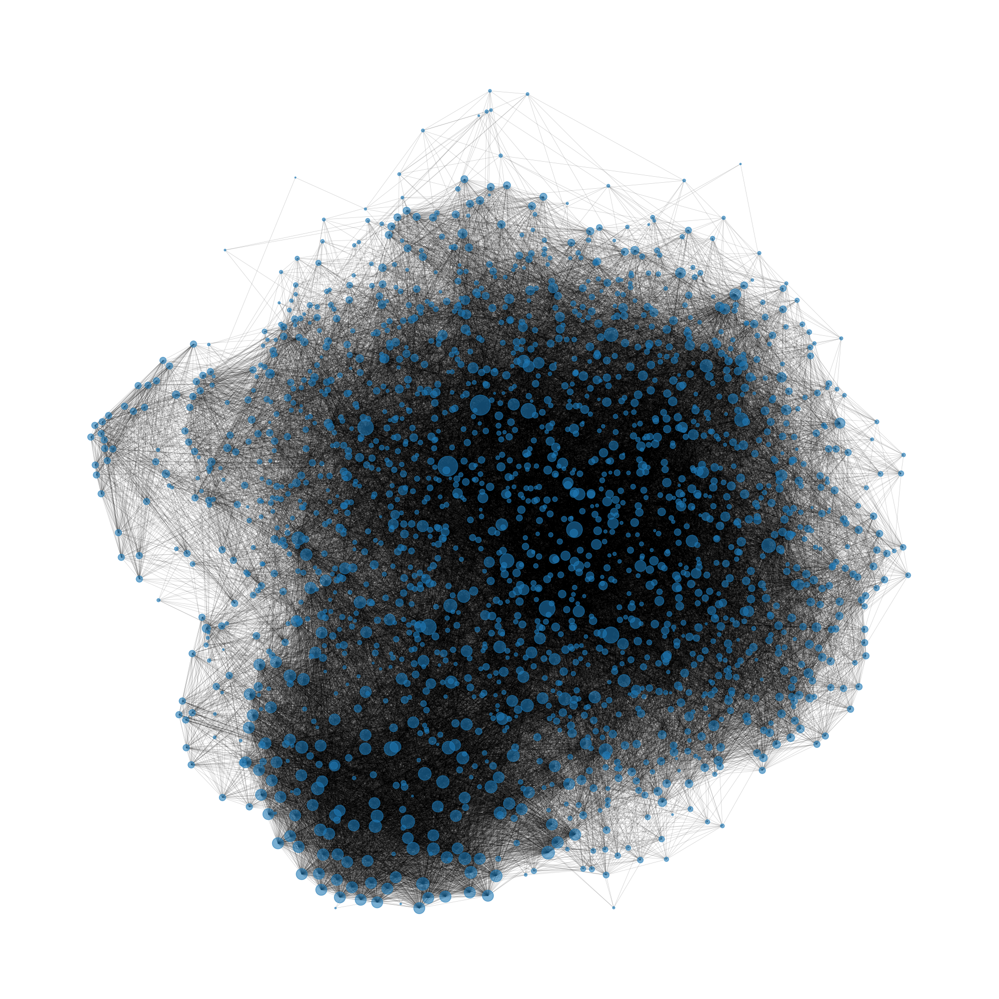

In [30]:
# Top degree nodes
top_n = 2000
top_nodes = sorted(I.degree(), key=lambda x: x[1], reverse=True)[:top_n]
top_node_names = [node for node, degree in top_nodes]
subgraph = I.subgraph(top_node_names)

# Plot figure
plt.figure(figsize=(20, 20))

# Fast layouts for large graphs:
pos = nx.forceatlas2_layout(subgraph)  # Good quality, slower
# pos = nx.spring_layout(subgraph, k=1, iterations=20)  # Faster

# Calculate node sizes based on degree
node_degrees = dict(subgraph.degree())
node_sizes = [node_degrees[node] * 2 for node in subgraph.nodes()]  # Scale factor of 2

# Draw without labels for speed
nx.draw_networkx_nodes(subgraph, pos, node_size=node_sizes, alpha=0.6)
nx.draw_networkx_edges(subgraph, pos, alpha=0.2, width=0.5)
plt.axis('off')
plt.tight_layout()
plt.savefig('network.png', dpi=150, bbox_inches='tight')


## Community detection

### Communities extracted from Louvain algorithm

Louvain modularity: 0.7135
Genre modularity not found in notebook variables; skipping comparison.
Layout: ForceAtlas2 (fa2) used.


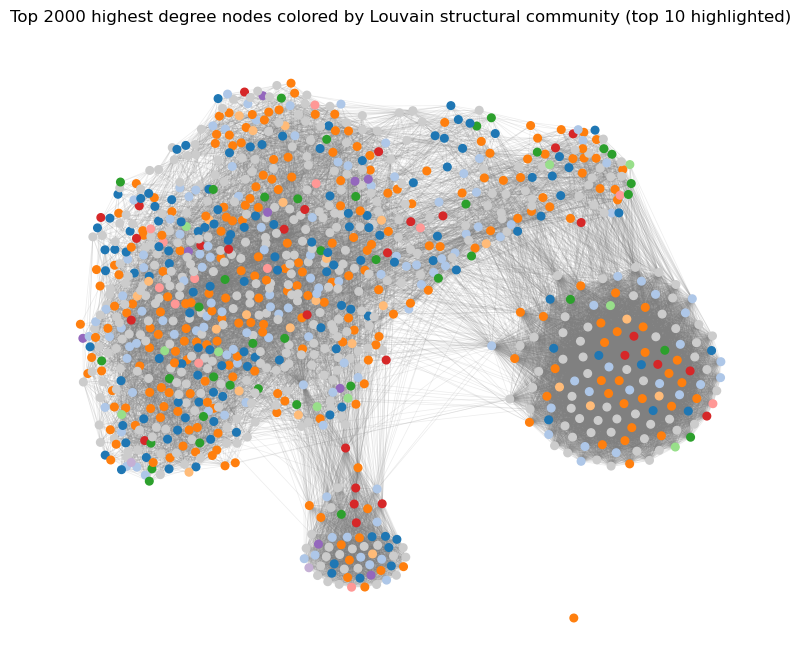

Number of Louvain communities: 3193
Sizes of top communities: [3771, 3101, 1426, 1039, 999, 882, 782, 751, 747, 712]

Interpretation hints:
- Higher Louvain modularity compared to genre modularity suggests structural communities align better with graph topology.
- If genre modularity is similar or higher, genres may already capture dense groups in the network.
- Backbone (spanning tree) highlights key bridging edges; check whether backbone edges connect different colored communities (bridges) or stay within communities (intra-community backbones).


In [ ]:
from collections import Counter
from networkx.algorithms.community import louvain_communities
from networkx import forceatlas2_layout
import networkx as nx

# Louvain structural communities, modularity, ForceAtlas (or fallback) visualization, and backbone view.
# Relies on notebook variables defined elsewhere: H, modularity_from_communities, _modularity_genres_first

def modularity_from_communities(G_in, communities):
    m_edges = G_in.number_of_edges()
    if m_edges == 0:
        return 0.0
    Q = 0.0
    for C in communities:
        L_c = G_in.subgraph(C).number_of_edges()             # internal edges
        D_c = sum(dict(G_in.degree(C)).values())             # sum of degrees (in G_in)
        Q += (L_c / m_edges) - (D_c / (2 * m_edges)) ** 2
    return Q

# 1) compute Louvain communities (try networkx implementation, fallback to python-louvain)
try:
    louvain_comms = louvain_communities(I, resolution=1, seed=42)
except Exception:
    try:
        import community as community_louvain  # python-louvain
        part = community_louvain.best_partition(H)
        tmp = {}
        for n, c in part.items():
            tmp.setdefault(c, []).append(n)
        louvain_comms = list(tmp.values())
    except Exception as e:
        raise RuntimeError("Louvain community detection not available: " + str(e))

# 2) modularity of Louvain partition (using provided helper)
Q_louvain = modularity_from_communities(I, louvain_comms)
print(f"Louvain modularity: {Q_louvain:.4f}")

# compare to genre-based modularity if available
if "_modularity_genres_first" in globals():
    Q_genre = _modularity_genres_first
    print(f"Genre (first-genre) modularity: {Q_genre:.4f}")
    if Q_louvain > Q_genre:
        print("Louvain partition is more community-like (higher modularity) than genres.")
    elif Q_louvain < Q_genre:
        print("Genres produce higher modularity than Louvain partition.")
    else:
        print("Modularity is equal for Louvain and genre partition (within numerical precision).")
else:
    print("Genre modularity not found in notebook variables; skipping comparison.")

# 3) prepare coloring for visualization: color top K largest communities, rest gray
comm_sizes = sorted([(i, len(c)) for i, c in enumerate(louvain_comms)], key=lambda x: -x[1])
top_k = 10
top_comm_idxs = [i for i, _ in comm_sizes[:top_k]]

node_to_comm = {}
for idx, comm in enumerate(louvain_comms):
    for n in comm:
        node_to_comm[n] = idx

# map nodes to colors
cmap = plt.get_cmap("tab20")
colors = {}
for i, comm_idx in enumerate(top_comm_idxs):
    colors[comm_idx] = cmap(i % 20)
# default color for small communities
default_color = (0.8, 0.8, 0.8)

# 4) select top 1000 nodes by degree
degrees = dict(I.degree())
top_1000_nodes = sorted(degrees.keys(), key=lambda x: degrees[x], reverse=True)[:1000]
top_1000_subgraph = I.subgraph(top_1000_nodes)
node_colors = [colors.get(node_to_comm.get(n, None), default_color) for n in top_1000_nodes]

# 5) compute layout: use forceatlas2_layout imported from networkx if available, else spring_layout
pos = None
try:
    pos = forceatlas2_layout(
                                top_1000_subgraph,
                                pos=None, 
                                max_iter=2000, 
                                gravity=0.3, 
                                strong_gravity=True, 
                                jitter_tolerance=0.5,
                                seed=42
    )
    print("Layout: ForceAtlas2 (fa2) used.")
except Exception:
    pos = nx.spring_layout(top_1000_subgraph, seed=42, k=0.1, iterations=200)
    print("Layout: networkx spring_layout used (ForceAtlas2 unavailable).")

# 6) draw top 1000 nodes colored by community (highlighting top K communities)
plt.figure(figsize=(10, 8))
# draw edges faintly
nx.draw_networkx_edges(top_1000_subgraph, pos, alpha=0.15, edge_color="gray", width=0.5)
# draw nodes
nx.draw_networkx_nodes(top_1000_subgraph, pos,
                       node_color=node_colors,
                       node_size=30)
plt.axis('off')
plt.title(f"Top 2000 highest degree nodes colored by Louvain structural community (top {top_k} highlighted)")
plt.show()

# # 7) backbone: try maximum spanning tree (if weights exist, uses 'weight'; otherwise unweighted)
# try:
#     # ensure we operate on an undirected simple Graph
#     if top_1000_subgraph.is_directed():
#         G = top_1000_subgraph.to_undirected(reciprocal=False)
#     else:
#         G = top_1000_subgraph.copy()

#     # If it's a MultiGraph, collapse multiple edges into a simple Graph,
#     # keeping the maximum weight when present (fallback weight=1.0).
#     if G.is_multigraph():
#         G_simple = nx.Graph()
#         for u, v, data in G.edges(data=True):
#             w = data.get('weight', 1.0)
#             if G_simple.has_edge(u, v):
#                 if w > G_simple[u][v].get('weight', float('-inf')):
#                     G_simple[u][v]['weight'] = w
#             else:
#                 attr = dict(data)
#                 attr['weight'] = w
#                 G_simple.add_edge(u, v, **attr)
#         G = G_simple

#     # compute maximum spanning tree on the undirected Graph
#     if any('weight' in d for _, _, d in G.edges(data=True)):
#         backbone = nx.maximum_spanning_tree(G, weight='weight')
#     else:
#         backbone = nx.maximum_spanning_tree(G)  # unweighted
#     print(f"Backbone edges: {backbone.number_of_edges()} (nodes: {backbone.number_of_nodes()})")
# except Exception as e:
#     backbone = None
#     print("Could not compute backbone spanning tree:", e)

# # 8) visualize backbone over colored nodes
# plt.figure(figsize=(10, 8))
# # draw all nodes lightly
# nx.draw_networkx_nodes(top_1000_subgraph, pos, node_color=node_colors, node_size=30)
# # draw full network faint edges
# nx.draw_networkx_edges(top_1000_subgraph, pos, alpha=0.05, edge_color="lightgray", width=0.5)
# # overlay backbone edges thicker and darker if available
# if backbone is not None:
#     nx.draw_networkx_edges(backbone, pos, edge_color="black", width=1.2, alpha=0.9)
#     plt.title("Backbone (maximum spanning tree) over structural communities - Top 1000 nodes")
# else:
#     plt.title("Backbone unavailable — showing top 1000 nodes colored by community")
# plt.axis('off')
# plt.show()

# 9) short quantitative summary of communities
num_comms = len(louvain_comms)
sizes = sorted([len(c) for c in louvain_comms], reverse=True)
print(f"Number of Louvain communities: {num_comms}")
print(f"Sizes of top communities: {sizes[:10]}")

# 10) brief suggested interpretation (printed)
print("\nInterpretation hints:")
print("- Higher Louvain modularity compared to genre modularity suggests structural communities align better with graph topology.")
print("- If genre modularity is similar or higher, genres may already capture dense groups in the network.")
print("- Backbone (spanning tree) highlights key bridging edges; check whether backbone edges connect different colored communities (bridges) or stay within communities (intra-community backbones).")

### Communities based on Industry 

#### Extract industries

In [24]:
import pandas as pd
import networkx as nx
from collections import defaultdict

# Read the data
df = pd.read_csv('anonymized_network_data.csv')

# Create a dictionary to store industry investments for each investor
investor_industries = defaultdict(lambda: defaultdict(int))

# Filter out rows with missing data
valid_data = df.dropna(subset=['Primary Industry Sector_deal', 'Investors'])

# Process the data using vectorized operations
for industry, investor in zip(valid_data['Primary Industry Sector_deal'], valid_data['Investors']):
    investor_industries[investor][industry] += 1

# Convert defaultdict to regular dict for each investor
for investor in investor_industries:
    investor_industries[investor] = dict(investor_industries[investor])

# Add the industry_investments attribute to investor nodes
for node in I.nodes():
    if node in investor_industries:
        I.nodes[node]['industry_investments'] = investor_industries[node]
    else:
        I.nodes[node]['industry_investments'] = {}


In [25]:
import networkx as nx

nx.write_gexf(I, "investor_network.gexf")

#### Communities on industries

In [26]:
# Create communities based on industries
industry_communities = {}

# Get all unique industries from all investors
all_industries = set()
for node in I.nodes():
    if 'industry_investments' in I.nodes[node]:
        all_industries.update(I.nodes[node]['industry_investments'].keys())

# Create a community for each industry
for industry in all_industries:
    industry_communities[industry] = []
    for node in I.nodes():
        if 'industry_investments' in I.nodes[node]:
            if industry in I.nodes[node]['industry_investments']:
                industry_communities[industry].append(node)

# Print community information
for industry, members in industry_communities.items():
    print(f"Industry: {industry}")
    print(f"Number of investors: {len(members)}")
    print(f"Members: {members[:10]}...")  # Show first 10 members
    print()


Industry: Materials and Resources
Number of investors: 1377
Members: ['Ethan Hall', 'Keaton Garcia', 'Mason Todorov', 'Ivan Carter', 'Viktor Nikolaou', 'Emil Hoffman', 'Marek Collins', 'David Keller', 'Chase Reed', 'Kurt Moore']...

Industry: Healthcare
Number of investors: 6077
Members: ['Max Adams', 'Mason Todorov', 'Keaton Gonzales', 'Kasper Kovacs', 'Wesley Leandros', 'Colin Markovic', 'Alan Bennett', 'Roy Becker', 'Lars Dimitrov', 'Austin Lopez']...

Industry: Consumer Products and Services (B2C)
Number of investors: 5894
Members: ['Dean Flores', 'Clay Cox', 'Magnus Wright', 'Damon Barnes', 'Ian Patterson', 'Pablo Håkansson', 'Thomas Hayes', 'Alan Bennett', 'Nathan Hansen', 'Cole Campbell']...

Industry: Business Products and Services (B2B)
Number of investors: 5879
Members: ['Martin Adams', 'Alexander Sheridan', 'Cole French', 'Mason Todorov', 'Jeffrey Jones', 'Rodrigo Serafeim', 'Stephen Martin', 'Felix Jennings', 'Seth Stoica', 'Nathan Hansen']...

Industry: Information Technol

In [27]:
import networkx as nx

# Calculate modularity of the communities
modularity = modularity_from_communities(I, industry_communities.values())
print(f"Modularity: {modularity:.4f}")


Modularity: 0.4318


Top 7 industries:
  1. Information Technology: 17427 investors
  2. Healthcare: 6077 investors
  3. Consumer Products and Services (B2C): 5894 investors
  4. Business Products and Services (B2B): 5879 investors
  5. Financial Services: 2359 investors
  6. Materials and Resources: 1377 investors
  7. Energy: 1140 investors

Top 7 Louvain communities:
  1. Louvain Community 1465: 3771 investors
  2. Louvain Community 823: 3101 investors
  3. Louvain Community 108: 1426 investors
  4. Louvain Community 2528: 1039 investors
  5. Louvain Community 293: 999 investors
  6. Louvain Community 1182: 882 investors
  7. Louvain Community 477: 782 investors

Confusion Matrix D (7 industries × 7 Louvain communities):
Rows = Industries, Columns = Louvain Communities
Matrix shape: (7, 7)

Confusion Matrix DataFrame:
                                          L0: Comm1465  L1: Comm823  \
I0: Information Technology                        1835         1692   
I1: Healthcare                                

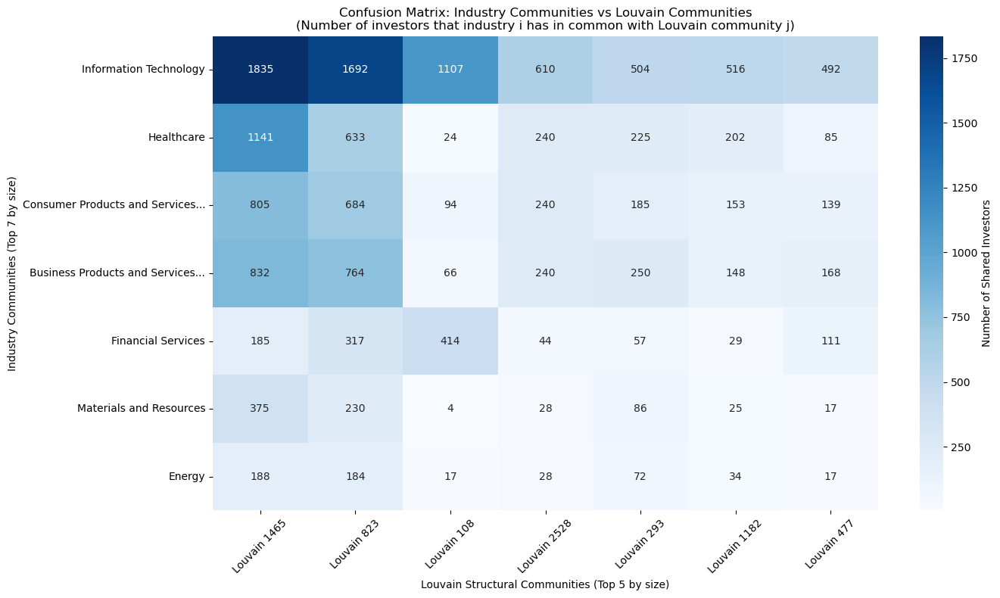


Industry totals (across top 5 Louvain communities):
  Information Technology: 6756 investors
  Healthcare: 2550 investors
  Consumer Products and Services (B2C): 2300 investors
  Business Products and Services (B2B): 2468 investors
  Financial Services: 1157 investors
  Materials and Resources: 765 investors
  Energy: 540 investors

Louvain community totals (across top 7 industries):
  Louvain Community 1465: 5361 investors
  Louvain Community 823: 4504 investors
  Louvain Community 108: 1726 investors
  Louvain Community 2528: 1430 investors
  Louvain Community 293: 1379 investors
  Louvain Community 1182: 1107 investors
  Louvain Community 477: 1029 investors


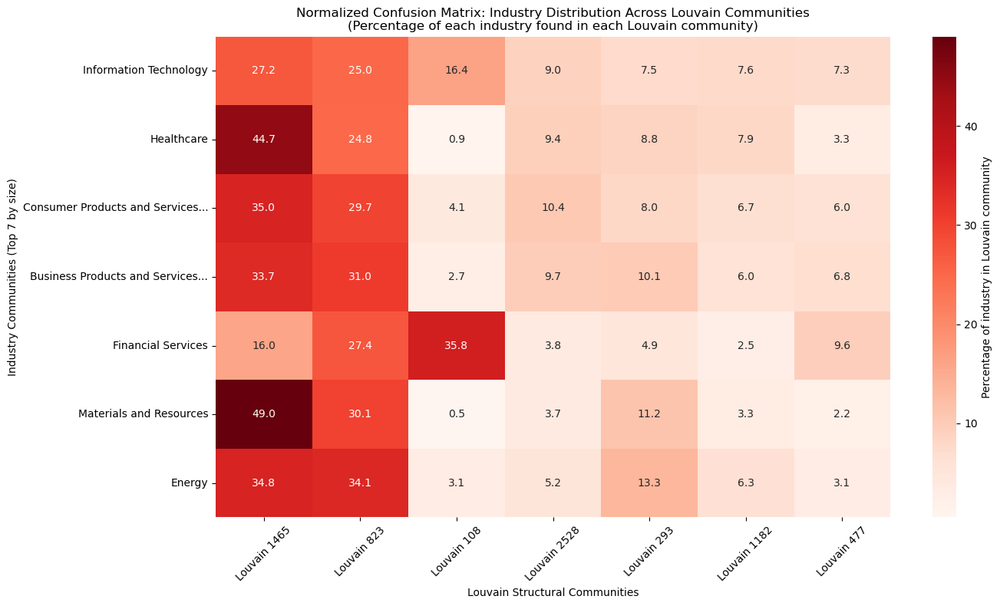


Additional Analysis:
Total overlap (investors in both top industries and top Louvain communities): 16536
Average investors per industry-Louvain intersection: 337.47
Maximum overlap: 1835 investors
Strongest association: Information Technology with Louvain Community 1465 (1835 investors)


In [ ]:

def create_industry_confusion_matrix(I, louvain_communities, industry_communities):
    """
    Create a confusion matrix comparing Louvain communities with industry-based communities.
    
    Args:
        I: NetworkX graph (investor network)
        louvain_communities: List of community sets from Louvain algorithm
        industry_communities: Dict of {industry: [list_of_investors]} from industry grouping
        
    Returns:
        tuple: (confusion_matrix, top_industries, top_louvain_communities, industry_to_idx, louvain_to_idx)
    """
    
    # Create mapping from node to Louvain community ID
    node_to_louvain = {}
    for i, community in enumerate(louvain_communities):
        for node in community:
            node_to_louvain[node] = i
    
    # Get Louvain community sizes and find top 7 largest communities
    louvain_sizes = [(i, len(community)) for i, community in enumerate(louvain_communities)]
    louvain_sizes.sort(key=lambda x: x[1], reverse=True)
    top_7_louvain = [comm_id for comm_id, size in louvain_sizes[:7]]
    
    # Get industry community sizes and find top 7 largest industries
    industry_sizes = [(industry, len(members)) for industry, members in industry_communities.items()]
    industry_sizes.sort(key=lambda x: x[1], reverse=True)
    top_7_industries = [industry for industry, size in industry_sizes[:7]]
    
    print("Top 7 industries:")
    for i, (industry, count) in enumerate(industry_sizes[:7]):
        print(f"  {i+1}. {industry}: {count} investors")
    
    print(f"\nTop 7 Louvain communities:")
    for i, (comm_id, size) in enumerate(louvain_sizes[:7]):
        print(f"  {i+1}. Louvain Community {comm_id}: {size} investors")
    
    # Create confusion matrix D (7 industries × 7 Louvain communities)
    D = np.zeros((7, 7), dtype=int)
    
    # Create mappings for matrix indices
    industry_to_idx = {industry: i for i, industry in enumerate(top_7_industries)}
    louvain_to_idx = {comm_id: i for i, comm_id in enumerate(top_7_louvain)}
    
    # Fill the confusion matrix
    for node in I.nodes():
        # Check if node is in one of the top 7 Louvain communities
        if node in node_to_louvain and node_to_louvain[node] in top_7_louvain:
            louvain_idx = louvain_to_idx[node_to_louvain[node]]
            
            # Check which industries this investor belongs to
            for industry in top_7_industries:
                if industry in industry_communities and node in industry_communities[industry]:
                    industry_idx = industry_to_idx[industry]
                    D[industry_idx, louvain_idx] += 1

    return D, top_7_industries, top_7_louvain, industry_to_idx, louvain_to_idx

# Create the confusion matrix
D, top_industries, top_louvain, industry_to_idx, louvain_to_idx = create_industry_confusion_matrix(
    I, louvain_comms, industry_communities
)

print(f"\nConfusion Matrix D ({len(top_industries)} industries × {len(top_louvain)} Louvain communities):")
print("Rows = Industries, Columns = Louvain Communities")
print(f"Matrix shape: {D.shape}")

# Create a pandas DataFrame for better visualization
df_confusion = pd.DataFrame(
    D, 
    index=[f"I{i}: {industry}" for i, industry in enumerate(top_industries)],
    columns=[f"L{i}: Comm{comm_id}" for i, comm_id in enumerate(top_louvain)]
)

print("\nConfusion Matrix DataFrame:")
print(df_confusion)

# Visualize the confusion matrix
plt.figure(figsize=(14, 8))
sns.heatmap(D, 
            xticklabels=[f"Louvain {comm_id}" for comm_id in top_louvain],
            yticklabels=[industry[:30] + '...' if len(industry) > 30 else industry for industry in top_industries],
            annot=True, 
            fmt='d', 
            cmap='Blues',
            cbar_kws={'label': 'Number of Shared Investors'})

plt.title('Confusion Matrix: Industry Communities vs Louvain Communities\n(Number of investors that industry i has in common with Louvain community j)')
plt.xlabel('Louvain Structural Communities (Top 5 by size)')
plt.ylabel('Industry Communities (Top 7 by size)')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Calculate row and column sums
row_sums = np.sum(D, axis=1)  # Total investors per industry (across all top Louvain communities)
col_sums = np.sum(D, axis=0)  # Total investors per Louvain community (across all top industries)

print(f"\nIndustry totals (across top 7 Louvain communities):")
for i, industry in enumerate(top_industries):
    print(f"  {industry}: {row_sums[i]} investors")

print(f"\nLouvain community totals (across top 7 industries):")
for i, comm_id in enumerate(top_louvain):
    print(f"  Louvain Community {comm_id}: {col_sums[i]} investors")

# Calculate normalized confusion matrix (percentages by row)
row_sums_safe = np.where(row_sums == 0, 1, row_sums)
D_normalized_by_row = D / row_sums_safe[:, np.newaxis] * 100

# Visualize normalized matrix
plt.figure(figsize=(14, 8))
sns.heatmap(D_normalized_by_row, 
            xticklabels=[f"Louvain {comm_id}" for comm_id in top_louvain],
            yticklabels=[industry[:30] + '...' if len(industry) > 30 else industry for industry in top_industries],
            annot=True, 
            fmt='.1f', 
            cmap='Reds',
            cbar_kws={'label': 'Percentage of industry in Louvain community'})

plt.title('Normalized Confusion Matrix: Industry Distribution Across Louvain Communities\n(Percentage of each industry found in each Louvain community)')
plt.xlabel('Louvain Structural Communities')
plt.ylabel('Industry Communities (Top 7 by size)')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Calculate some additional metrics
print(f"\nAdditional Analysis:")
print(f"Total overlap (investors in both top industries and top Louvain communities): {np.sum(D)}")
print(f"Average investors per industry-Louvain intersection: {np.mean(D):.2f}")
print(f"Maximum overlap: {np.max(D)} investors")

# Find the strongest industry-Louvain associations
max_indices = np.unravel_index(np.argmax(D), D.shape)
strongest_industry = top_industries[max_indices[0]]
strongest_louvain = top_louvain[max_indices[1]]
print(f"Strongest association: {strongest_industry} with Louvain Community {strongest_louvain} ({np.max(D)} investors)")

## NLP for community focus

### Term Frequency lists for each investor

In [42]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Extract company descriptions for investors
def create_investor_portfolio_descriptions(I, df):
    """Create portfolio descriptions for each investor based on companies they invest in"""
    investor_portfolios = {}
    
    for investor in I.nodes():
        # Get all companies this investor has invested in
        company_descriptions = []
        investor_rows = df[df['Investors'] == investor]
        
        for _, row in investor_rows.iterrows():
            if pd.notna(row['Description_deal']):
                company_descriptions.append(row['Description_deal'])
        
        # Combine all company descriptions for this investor
        investor_portfolios[investor] = ' '.join(company_descriptions)
    
    return investor_portfolios

# Create portfolio descriptions
investor_portfolios = create_investor_portfolio_descriptions(I, df)

# Remove empty portfolios
investor_portfolios = {k: v for k, v in investor_portfolios.items() if v.strip()}

print(f"Created portfolio descriptions for {len(investor_portfolios)} investors")


Created portfolio descriptions for 31753 investors


In [56]:
def preprocess_portfolio_descriptions_to_tf(investor_portfolios, min_frequency=3):
    """
    Preprocess portfolio descriptions and create Term Frequency lists.
    
    Args:
        investor_portfolios: Dict of {investor: portfolio_description}
        min_frequency: Minimum word frequency to keep (default=3)
        
    Returns:
        investor_tf_lists: Dict of {investor: {word: count}}
        global_vocabulary: Set of all valid words after filtering
        global_word_counts: Counter object with all word frequencies
    """
    
    print("Step 1: Converting to lowercase, removing punctuation, and tokenizing...")
    
    # Step 1 & 2: Lowercase, remove punctuation, tokenize for each investor
    investor_tokens = {}
    all_tokens = []
    
    for investor, description in investor_portfolios.items():
        # Convert to lowercase
        text = description.lower()
        
        # Remove punctuation using regex (keeps only letters, numbers, and spaces)
        text = re.sub(r'[^\w\s]', ' ', text)
        
        # Split into tokens (words)
        tokens = text.split()
        
        # Remove extra whitespace, empty tokens, and stopwords
        clean_tokens = []
        for token in tokens:
            token = token.strip()
            if token and token not in stop_words:
                clean_tokens.append(token)
        
        if clean_tokens:  # Only keep investors with valid tokens
            investor_tokens[investor] = clean_tokens
            all_tokens.extend(clean_tokens)
    
    print(f"Total tokens before filtering: {len(all_tokens)}")
    print(f"Unique tokens before filtering: {len(set(all_tokens))}")
    
    # Step 2: Count word frequencies globally
    print(f"\nStep 2: Counting global word frequencies...")
    global_word_counts = Counter(all_tokens)
    
    print(f"Most common words:")
    for word, count in global_word_counts.most_common(10):
        print(f"  {word}: {count}")
    
    # Step 3: Filter out rare words
    print(f"\nStep 3: Filtering words with frequency < {min_frequency}...")
    global_vocabulary = {word for word, count in global_word_counts.items() if count >= min_frequency}
    
    print(f"Vocabulary size after filtering: {len(global_vocabulary)}")
    print(f"Words removed: {len(global_word_counts) - len(global_vocabulary)}")
    
    # Step 4: Create Term Frequency lists for each investor
    print(f"\nStep 4: Creating Term Frequency lists for each investor...")
    investor_tf_lists = {}
    
    for investor, tokens in investor_tokens.items():
        # Filter tokens to only include words in vocabulary (stopwords and rare words already removed)
        valid_tokens = [token for token in tokens if token in global_vocabulary]
        
        if valid_tokens:  # Only keep investors with valid tokens
            # Count frequency of each word for this investor
            tf_counts = Counter(valid_tokens)
            investor_tf_lists[investor] = dict(tf_counts)
    
    print(f"Investors with valid TF lists: {len(investor_tf_lists)}")
    print(f"Investors filtered out (no valid tokens): {len(investor_portfolios) - len(investor_tf_lists)}")
    
    return investor_tf_lists, global_vocabulary, global_word_counts


investor_tf_lists, global_vocabulary, global_word_counts = preprocess_portfolio_descriptions_to_tf(
    investor_portfolios, min_frequency=3
)

Step 1: Converting to lowercase, removing punctuation, and tokenizing...
Total tokens before filtering: 2449324
Unique tokens before filtering: 19283

Step 2: Counting global word frequencies...
Most common words:
  company: 65989
  enabling: 58184
  platform: 55545
  developer: 43555
  designed: 39489
  intended: 22034
  data: 21052
  offers: 20195
  technology: 15240
  management: 13064

Step 3: Filtering words with frequency < 3...
Vocabulary size after filtering: 15381
Words removed: 3902

Step 4: Creating Term Frequency lists for each investor...
Investors with valid TF lists: 31753
Investors filtered out (no valid tokens): 0


In [60]:
# see top 15 words for 3 sample investors
sample_investors = list(investor_tf_lists.keys())[:3]
for investor in sample_investors:
    print(f"\nInvestor: {investor}")
    tf_list = investor_tf_lists[investor]
    sorted_tf = sorted(tf_list.items(), key=lambda x: x[1], reverse=True)[:5]
    for word, count in sorted_tf:
        print(f"  {word}: {count}")


Investor: Dean Flores
  bread: 3
  company: 2
  operator: 1
  intended: 1
  provide: 1

Investor: Ethan Hall
  farms: 3
  horticulture: 2
  export: 2
  fruits: 2
  operator: 1

Investor: Derrick Ross
  automotive: 2
  repair: 2
  developer: 1
  ai: 1
  powered: 1


### Calculate TF - IDF: Extract most frequent words

#### For industries

In [64]:
def create_industry_tf_lists(industry_communities, investor_tf_lists):
    """
    Group investors by industry and combine their TF lists.
    
    Args:
        industry_communities: Dict of {industry: [list_of_investors]}
        investor_tf_lists: Dict of {investor: {word: count}}
    
    Returns:
        industry_tf_lists: Dict of {industry: {word: total_count}}
    """
    industry_tf_lists = {}
    
    for industry, investors in industry_communities.items():
        industry_tf = defaultdict(int)
        
        # Combine TF counts for all investors in this industry
        for investor in investors:
            if investor in investor_tf_lists:
                for word, count in investor_tf_lists[investor].items():
                    industry_tf[word] += count
        
        # Convert to regular dict and only keep industries with words
        if industry_tf:
            industry_tf_lists[industry] = dict(industry_tf)
    
    return industry_tf_lists

def calculate_idf(industry_tf_lists, base=math.e):
    """
    Calculate IDF (Inverse Document Frequency) for all words.
    
    Args:
        industry_tf_lists: Dict of {industry: {word: count}}
        base: Base for logarithm (default: e for natural log)
    
    Returns:
        idf_scores: Dict of {word: idf_score}
    """
    # Count total number of documents (industries)
    total_docs = len(industry_tf_lists)
    
    # Count how many documents contain each word
    word_doc_count = defaultdict(int)
    
    for industry, tf_dict in industry_tf_lists.items():
        for word in tf_dict.keys():
            word_doc_count[word] += 1
    
    # Calculate IDF for each word: log(total_docs / docs_containing_word)
    idf_scores = {}
    for word, doc_count in word_doc_count.items():
        idf_scores[word] = math.log(total_docs / doc_count, base)
    
    return idf_scores

def calculate_tf_idf(industry_tf_lists, idf_scores):
    """
    Calculate TF-IDF scores for each industry.
    
    Args:
        industry_tf_lists: Dict of {industry: {word: count}}
        idf_scores: Dict of {word: idf_score}
    
    Returns:
        tf_idf_scores: Dict of {industry: {word: tf_idf_score}}
    """
    tf_idf_scores = {}
    
    for industry, tf_dict in industry_tf_lists.items():
        tf_idf_dict = {}
        
        # Calculate total words in this industry for normalization
        total_words = sum(tf_dict.values())
        
        for word, tf_count in tf_dict.items():
            # TF = word_count / total_words (normalized term frequency)
            tf = tf_count / total_words
            
            # TF-IDF = TF * IDF
            tf_idf = tf * idf_scores[word]
            tf_idf_dict[word] = tf_idf
        
        tf_idf_scores[industry] = tf_idf_dict
    
    return tf_idf_scores

# Step 1: Create industry TF lists by combining investor TF lists
print("Step 1: Creating industry TF lists...")
industry_tf_lists = create_industry_tf_lists(industry_communities, investor_tf_lists)

print(f"Created TF lists for {len(industry_tf_lists)} industries")
for industry, tf_dict in list(industry_tf_lists.items())[:3]:
    print(f"\n{industry}: {len(tf_dict)} unique words")
    top_words = sorted(tf_dict.items(), key=lambda x: x[1], reverse=True)[:5]
    print(f"  Top words: {top_words}")

# Step 2: Calculate IDF scores
print(f"\nStep 2: Calculating IDF scores...")
print("Using natural logarithm (base e) for IDF calculation.")
print("Base choice affects scale but not relative ranking of words.")

idf_scores = calculate_idf(industry_tf_lists, base=math.e)

print(f"Calculated IDF for {len(idf_scores)} unique words")
print(f"IDF range: [{min(idf_scores.values()):.3f}, {max(idf_scores.values()):.3f}]")

# Show some example IDF scores
sorted_idf = sorted(idf_scores.items(), key=lambda x: x[1], reverse=True)
print(f"\nHighest IDF words (rarest): {sorted_idf[:5]}")
print(f"Lowest IDF words (most common): {sorted_idf[-5:]}")

# Step 3: Calculate TF-IDF scores
print(f"\nStep 3: Calculating TF-IDF scores...")
tf_idf_scores = calculate_tf_idf(industry_tf_lists, idf_scores)

print(f"Calculated TF-IDF for {len(tf_idf_scores)} industries")

Step 1: Creating industry TF lists...
Created TF lists for 7 industries

Materials and Resources: 11520 unique words
  Top words: [('company', 9290), ('enabling', 8132), ('developer', 5704), ('platform', 5345), ('designed', 5304)]

Healthcare: 13951 unique words
  Top words: [('company', 24361), ('enabling', 21178), ('platform', 17422), ('developer', 16426), ('designed', 14912)]

Consumer Products and Services (B2C): 13933 unique words
  Top words: [('company', 22778), ('enabling', 20062), ('platform', 17491), ('developer', 12396), ('designed', 11554)]

Step 2: Calculating IDF scores...
Using natural logarithm (base e) for IDF calculation.
Base choice affects scale but not relative ranking of words.
Calculated IDF for 15381 unique words
IDF range: [0.000, 1.946]

Highest IDF words (rarest): [('polyethene', 1.9459101490553132), ('polyols', 1.9459101490553132), ('epoxide', 1.9459101490553132), ('precursors', 1.9459101490553132), ('lime', 1.9459101490553132)]
Lowest IDF words (most common

In [ ]:
# Step 4: Compare top words by TF vs TF-IDF for each industry
print("="*80)
print("COMPARISON: TOP 10 WORDS BY TF vs TF-IDF FOR EACH INDUSTRY")
print("="*80)

# Get top 7 industries by size for analysis
industry_sizes = [(industry, len(members)) for industry, members in industry_communities.items()]
industry_sizes.sort(key=lambda x: x[1], reverse=True)
top_industries = [industry for industry, size in industry_sizes[:7]]

for industry in top_industries:
    if industry in tf_idf_scores:
        print(f"\n{'='*60}")
        print(f"INDUSTRY: {industry}")
        print(f"Number of investors: {len(industry_communities[industry])}")
        print(f"{'='*60}")
        
        # Get top 10 words by TF (raw frequency)
        tf_top = sorted(industry_tf_lists[industry].items(), key=lambda x: x[1], reverse=True)[:10]
        
        # Get top 10 words by TF-IDF
        tfidf_top = sorted(tf_idf_scores[industry].items(), key=lambda x: x[1], reverse=True)[:10]
        
        print(f"\nTOP 10 WORDS BY TF (Raw Frequency):")
        for i, (word, tf_count) in enumerate(tf_top, 1):
            print(f"  {i:2d}. {word:<20} (count: {tf_count:>4})")
        
        print(f"\nTOP 10 WORDS BY TF-IDF:")
        for i, (word, tfidf_score) in enumerate(tfidf_top, 1):
            tf_count = industry_tf_lists[industry].get(word, 0)
            idf_score = idf_scores.get(word, 0)
            print(f"  {i:2d}. {word:<20} (TF-IDF: {tfidf_score:>7.4f}, TF: {tf_count:>4}, IDF: {idf_score:>6.3f})")
        
        # Compare the lists
        tf_words = {word for word, _ in tf_top}
        tfidf_words = {word for word, _ in tfidf_top}
        
        overlap = len(tf_words & tfidf_words)
        tf_only = tf_words - tfidf_words
        tfidf_only = tfidf_words - tf_words
        
        print(f"\nCOMPARISON:")
        print(f"  Words in both top-10 lists: {overlap}/10")
        print(f"  Only in TF top-10: {tf_only}")
        print(f"  Only in TF-IDF top-10: {tfidf_only}")

print(f"\n{'='*80}")
print("ANALYSIS: ARE TF-IDF WORDS MORE DESCRIPTIVE?")
print("="*80)
print("""
TF-IDF words are generally MORE descriptive than TF-only words because:

1. **TF-IDF penalizes common words**: Words that appear in many industries get lower 
   IDF scores, so they rank lower even if they're frequent within an industry.

2. **TF-IDF highlights distinctive words**: Words that are frequent in one industry 
   but rare in others get high TF-IDF scores, making them more characteristic.

3. **TF alone favors volume**: Raw TF just counts frequency, so common words like 
   'company', 'services', 'technology' dominate regardless of distinctiveness.

4. **Industry-specific terminology**: TF-IDF tends to surface industry jargon and 
   specialized terms that truly distinguish one industry from another.

""")

COMPARISON: TOP 10 WORDS BY TF vs TF-IDF FOR EACH INDUSTRY

INDUSTRY: Information Technology
Number of investors: 17427

TOP 10 WORDS BY TF (Raw Frequency):
   1. company              (count: 45898)
   2. platform             (count: 44459)
   3. enabling             (count: 41331)
   4. developer            (count: 33779)
   5. designed             (count: 30258)
   6. data                 (count: 18121)
   7. offers               (count: 14159)
   8. intended             (count: 13134)
   9. management           (count: 11064)
  10. software             (count: 10247)

TOP 10 WORDS BY TF-IDF:
   1. barcodes             (TF-IDF:  0.0000, TF:   33, IDF:  1.253)
   2. solitaire            (TF-IDF:  0.0000, TF:   20, IDF:  1.946)
   3. homoglyph            (TF-IDF:  0.0000, TF:   18, IDF:  1.946)
   4. ran                  (TF-IDF:  0.0000, TF:   26, IDF:  1.253)
   5. vacuuming            (TF-IDF:  0.0000, TF:   26, IDF:  1.253)
   6. scrubbing            (TF-IDF:  0.0000, TF:   26, IDF


CREATING TF-IDF WORD CLOUDS FOR TOP INDUSTRIES


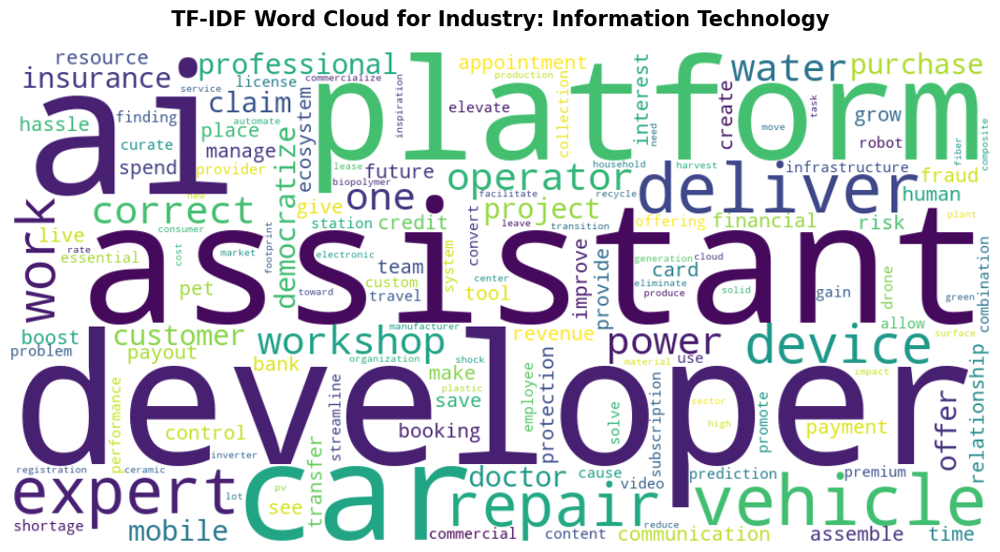


Industry: Information Technology
Total unique words: 14695
Number of investors: 17427
Top 10 TF-IDF words: ['barcodes', 'solitaire', 'homoglyph', 'ran', 'vacuuming', 'scrubbing', 'epitaxial', 'immigration', 'dexes', 'seeding']
--------------------------------------------------------------------------------


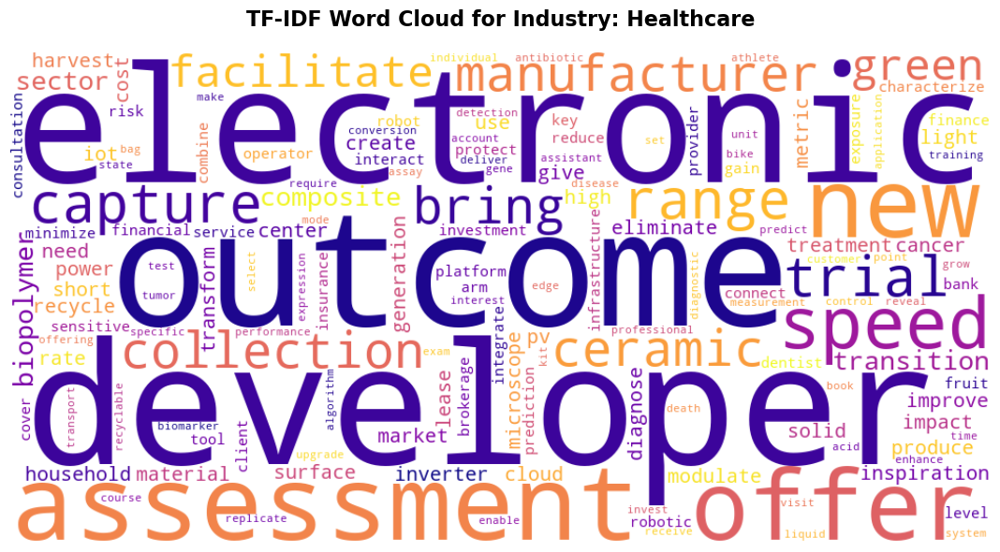


Industry: Healthcare
Total unique words: 13951
Number of investors: 6077
Top 10 TF-IDF words: ['nash', 'inhibits', 'fibroids', 'genmab', 'steatohepatitis', 'neuropathy', 'nanocapsules', 'embryo', 'phenotyping', 'photosensitizing']
--------------------------------------------------------------------------------


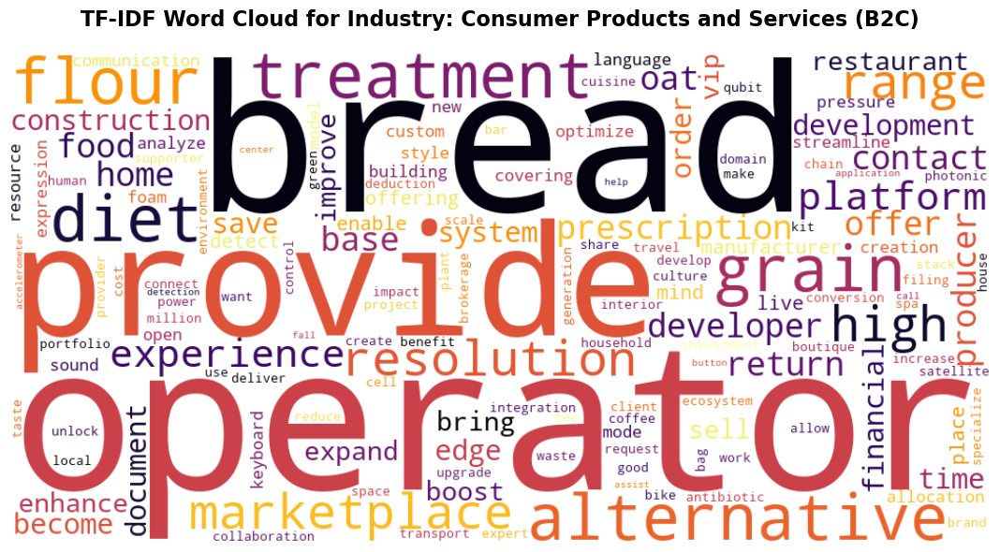


Industry: Consumer Products and Services (B2C)
Total unique words: 13933
Number of investors: 5894
Top 10 TF-IDF words: ['nootropic', 'gummies', 'sicilian', 'dragon', 'pickled', 'hrv', 'tequila', 'dough', 'strawberry', 'orphanages']
--------------------------------------------------------------------------------


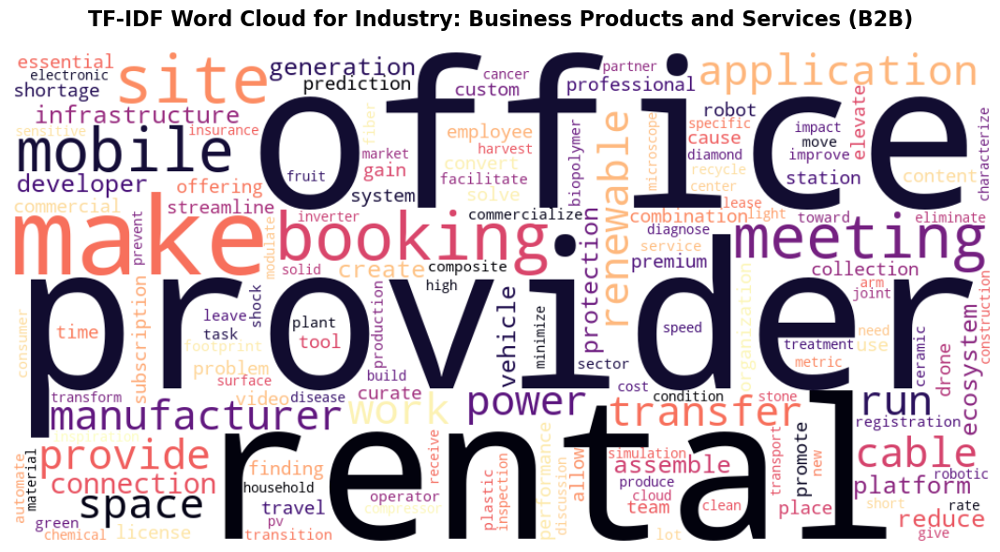


Industry: Business Products and Services (B2B)
Total unique words: 13931
Number of investors: 5879
Top 10 TF-IDF words: ['titania', 'vinyl', 'hvdc', 'skies', 'vertiports', 'malfunctioning', 'unqualified', 'seasoned', 'bee', 'hydrofoil']
--------------------------------------------------------------------------------


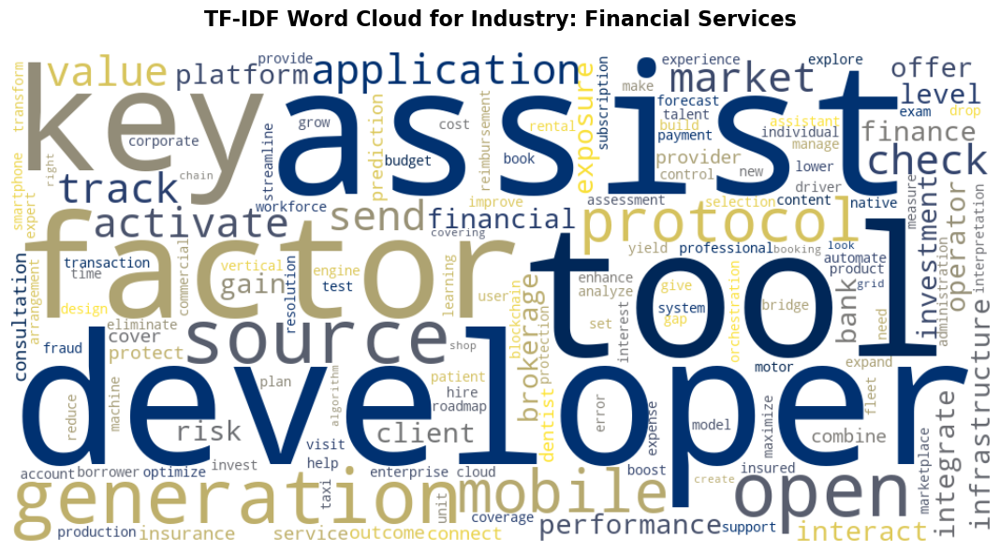


Industry: Financial Services
Total unique words: 11654
Number of investors: 2359
Top 10 TF-IDF words: ['scouring', 'algorand', 'dex', 'democratise', 'validators', 'staking', 'repurchase', 'repo', 'tokenizes', 'web30']
--------------------------------------------------------------------------------


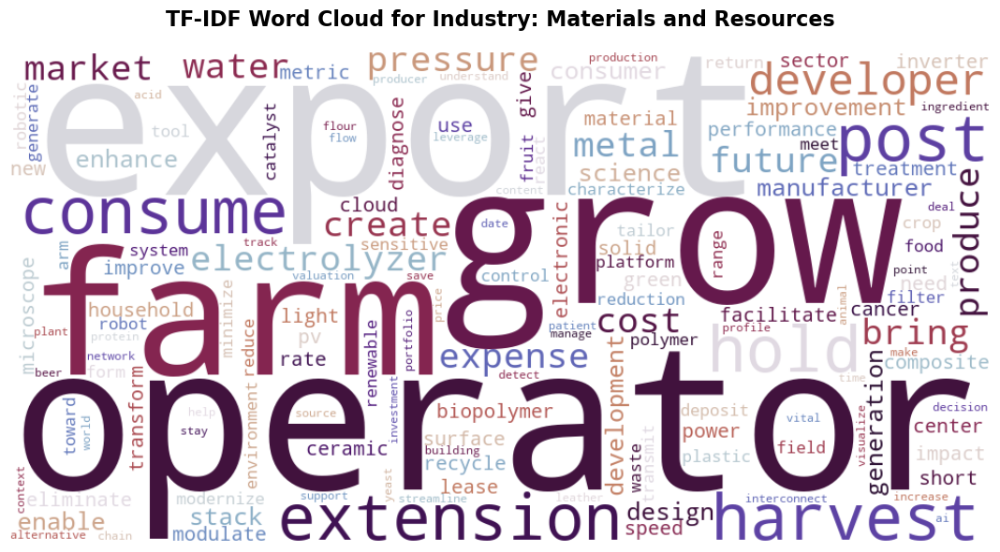


Industry: Materials and Resources
Total unique words: 11520
Number of investors: 1377
Top 10 TF-IDF words: ['polyols', 'epoxide', 'precursors', 'sealants', 'alter', 'polyurethane', 'peels', 'polyethene', 'lime', 'limes']
--------------------------------------------------------------------------------


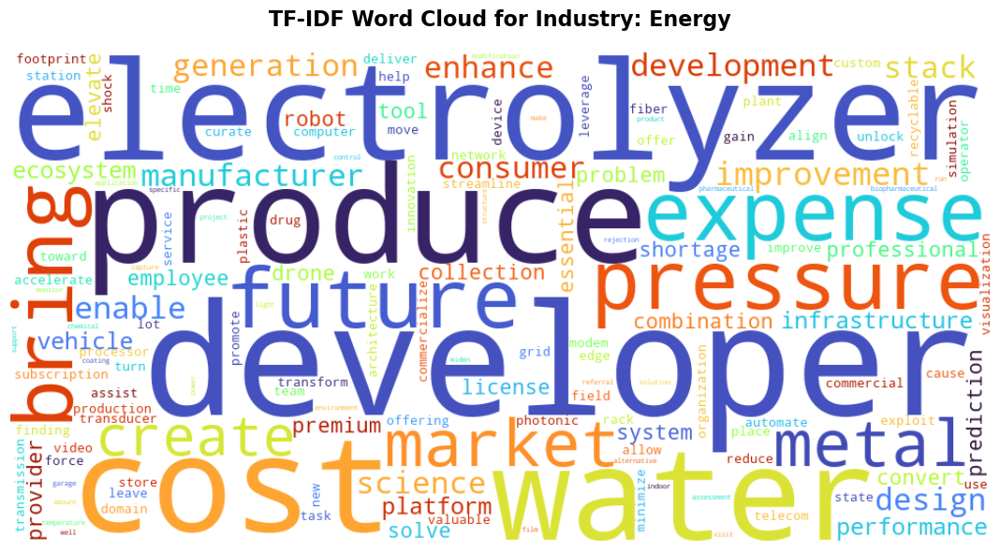


Industry: Energy
Total unique words: 11137
Number of investors: 1140
Top 10 TF-IDF words: ['tritium', 'levelized', 'bunker', 'gyrotron', 'mere', 'shaftless', 'tether', 'kerosene', 'hybridized', 'convertible']
--------------------------------------------------------------------------------


In [69]:
def tf_idf_to_string(tf_idf_dict, scale_factor=1000):
    """
    Convert TF-IDF scores to a string for word cloud generation.
    Since word clouds expect integer frequencies, we scale TF-IDF scores.
    
    Args:
        tf_idf_dict: Dictionary of {word: tf_idf_score}
        scale_factor: Multiplier to convert TF-IDF to integer counts
        
    Returns:
        string: Words repeated according to scaled TF-IDF scores
    """
    words = []
    for word, tfidf_score in tf_idf_dict.items():
        # Scale TF-IDF score and convert to integer
        repeat_count = max(1, int(tfidf_score * scale_factor))
        words.extend([word] * repeat_count)
    
    return ' '.join(words)

def create_industry_wordcloud(industry_name, tf_idf_dict, colormap='viridis'):
    """
    Create a word cloud for an industry using TF-IDF scores.
    
    Args:
        industry_name: Name of the industry
        tf_idf_dict: TF-IDF scores for this industry
        colormap: Color scheme for the word cloud
    """
    # Convert TF-IDF to string
    text_string = tf_idf_to_string(tf_idf_dict, scale_factor=1000)
    
    if not text_string.strip():
        print(f"No text available for industry: {industry_name}")
        return
    
    # Create WordCloud object
    wordcloud = WordCloud(
        width=1000,
        height=500,
        background_color='white',
        colormap=colormap,
        collocations=False,
        max_words=150,
        relative_scaling=0.6,
        random_state=42
    ).generate(text_string)
    
    # Create the plot
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'TF-IDF Word Cloud for Industry: {industry_name}', 
              fontsize=16, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    top_tfidf = sorted(tf_idf_dict.items(), key=lambda x: x[1], reverse=True)[:10]
    print(f"\nIndustry: {industry_name}")
    print(f"Total unique words: {len(tf_idf_dict)}")
    print(f"Number of investors: {len(industry_communities[industry_name])}")
    print(f"Top 10 TF-IDF words: {[word for word, _ in top_tfidf]}")
    print("-" * 80)

# Create word clouds for top 7 industries
print("\n" + "="*80)
print("CREATING TF-IDF WORD CLOUDS FOR TOP INDUSTRIES")
print("="*80)

# Color schemes for variety
color_schemes = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'twilight', 'turbo']

# Create word clouds for each top industry
for i, industry in enumerate(top_industries):
    if industry in tf_idf_scores:
        colormap = color_schemes[i % len(color_schemes)]
        create_industry_wordcloud(industry, tf_idf_scores[industry], colormap)


CREATING TF-IDF WORD CLOUDS FOR TOP INDUSTRIES


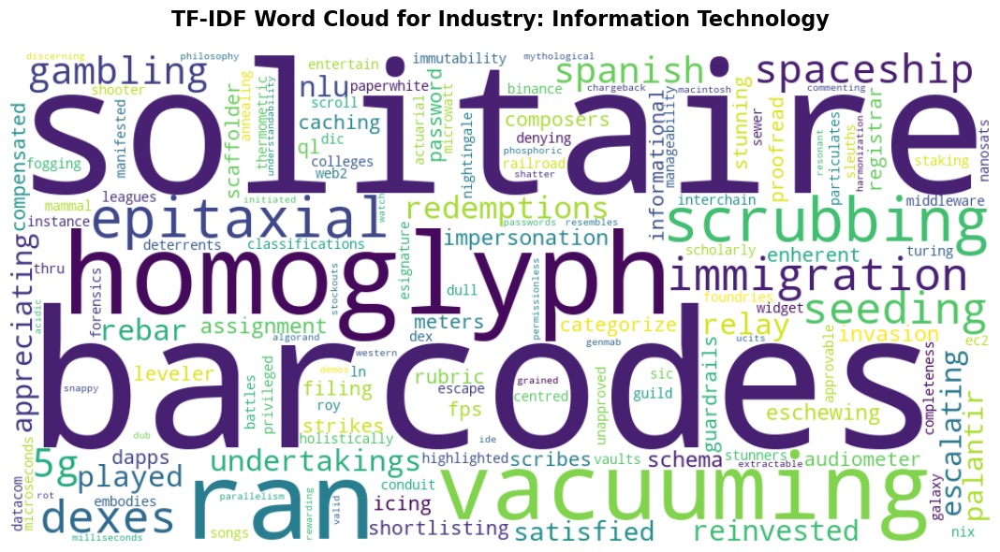


Industry: Information Technology
Total unique words: 14695
Number of investors: 17427
Top 10 TF-IDF words: ['barcodes', 'solitaire', 'homoglyph', 'ran', 'vacuuming', 'scrubbing', 'epitaxial', 'immigration', 'dexes', 'seeding']
--------------------------------------------------------------------------------


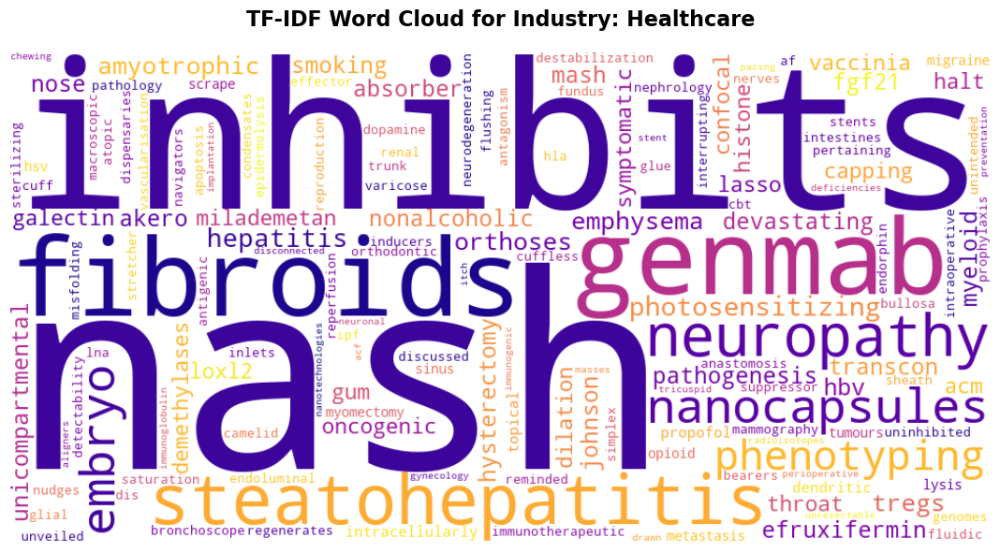


Industry: Healthcare
Total unique words: 13951
Number of investors: 6077
Top 10 TF-IDF words: ['nash', 'inhibits', 'fibroids', 'genmab', 'steatohepatitis', 'neuropathy', 'nanocapsules', 'embryo', 'phenotyping', 'photosensitizing']
--------------------------------------------------------------------------------


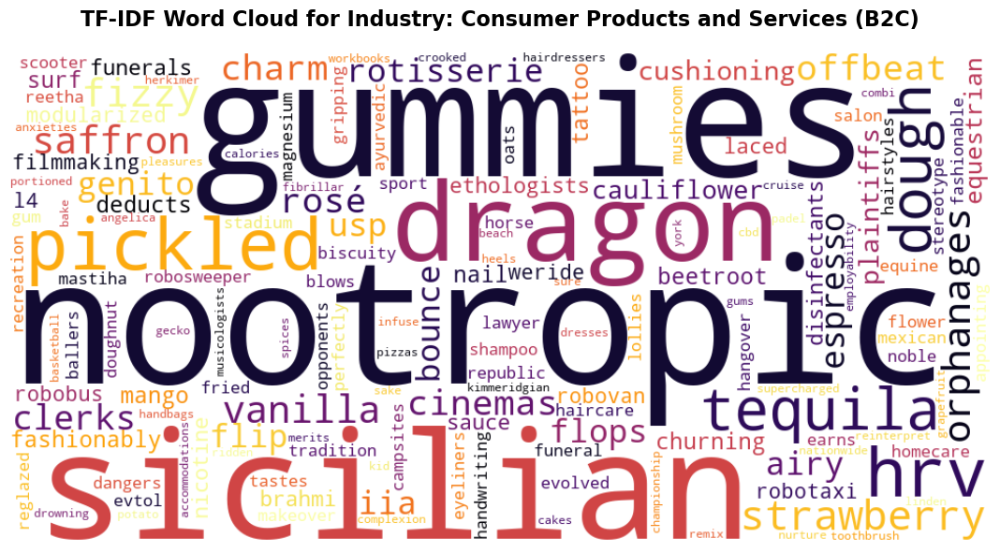


Industry: Consumer Products and Services (B2C)
Total unique words: 13933
Number of investors: 5894
Top 10 TF-IDF words: ['nootropic', 'gummies', 'sicilian', 'dragon', 'pickled', 'hrv', 'tequila', 'dough', 'strawberry', 'orphanages']
--------------------------------------------------------------------------------


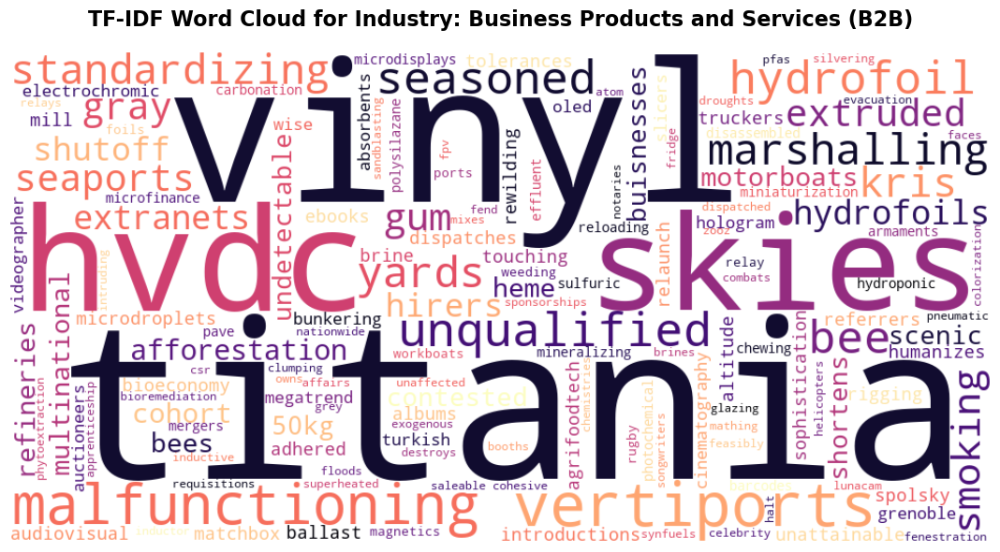


Industry: Business Products and Services (B2B)
Total unique words: 13931
Number of investors: 5879
Top 10 TF-IDF words: ['titania', 'vinyl', 'hvdc', 'skies', 'vertiports', 'malfunctioning', 'unqualified', 'seasoned', 'bee', 'hydrofoil']
--------------------------------------------------------------------------------


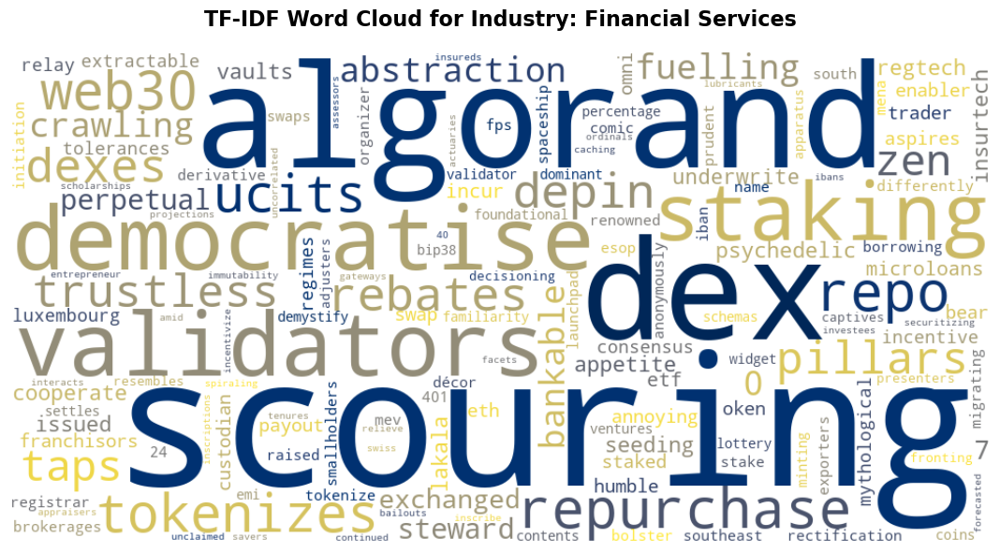


Industry: Financial Services
Total unique words: 11654
Number of investors: 2359
Top 10 TF-IDF words: ['scouring', 'algorand', 'dex', 'democratise', 'validators', 'staking', 'repurchase', 'repo', 'tokenizes', 'web30']
--------------------------------------------------------------------------------


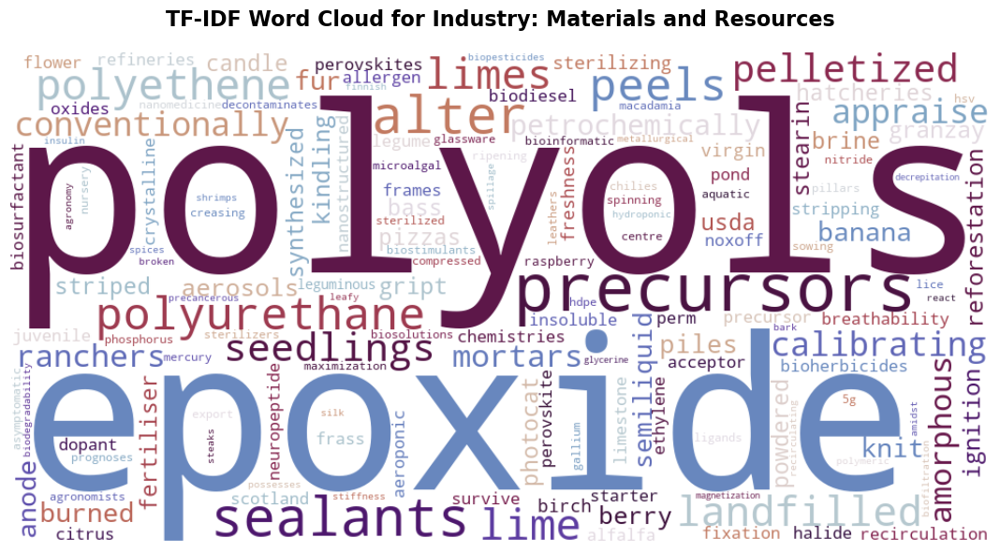


Industry: Materials and Resources
Total unique words: 11520
Number of investors: 1377
Top 10 TF-IDF words: ['polyols', 'epoxide', 'precursors', 'sealants', 'alter', 'polyurethane', 'peels', 'polyethene', 'lime', 'limes']
--------------------------------------------------------------------------------


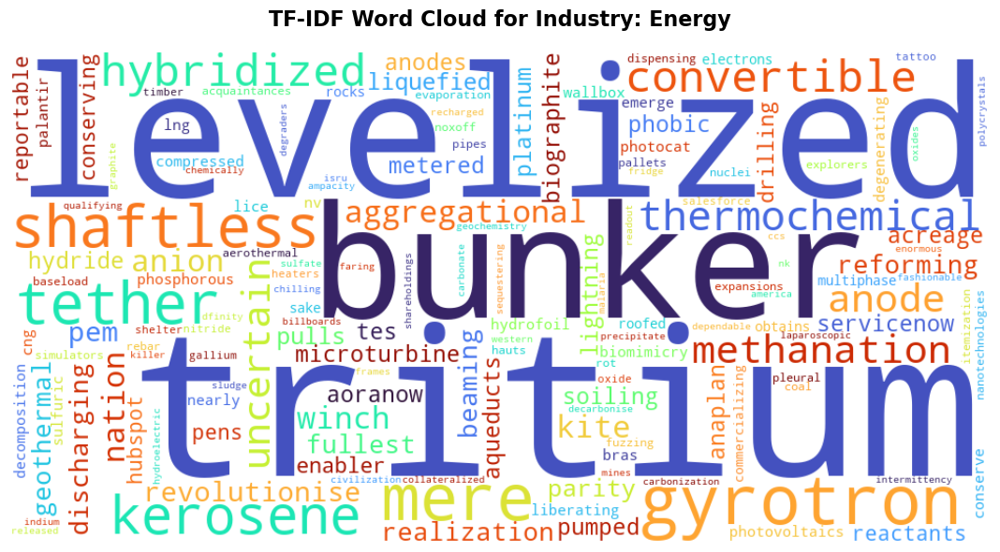


Industry: Energy
Total unique words: 11137
Number of investors: 1140
Top 10 TF-IDF words: ['tritium', 'levelized', 'bunker', 'gyrotron', 'mere', 'shaftless', 'tether', 'kerosene', 'hybridized', 'convertible']
--------------------------------------------------------------------------------


In [ ]:
def tf_idf_to_string(tf_idf_dict, scale_factor=1000):
    """
    Convert TF-IDF scores to a string for word cloud generation.
    Since word clouds expect integer frequencies, we scale TF-IDF scores.
    
    Args:
        tf_idf_dict: Dictionary of {word: tf_idf_score}
        scale_factor: Multiplier to convert TF-IDF to integer counts
        
    Returns:
        string: Words repeated according to scaled TF-IDF scores
    """
    words = []
    for word, tfidf_score in tf_idf_dict.items():
        # Scale TF-IDF score and convert to integer
        repeat_count = max(1, int(tfidf_score * scale_factor))
        words.extend([word] * repeat_count)
    
    return ' '.join(words)

def create_industry_wordcloud(industry_name, tf_idf_dict, colormap='viridis'):
    """
    Create a word cloud for an industry using TF-IDF scores.
    
    Args:
        industry_name: Name of the industry
        tf_idf_dict: TF-IDF scores for this industry
        colormap: Color scheme for the word cloud
    """
    # Keep only positive TF-IDF values
    freqs = {w: float(v) for w, v in tf_idf_dict.items() if v > 0}
    if not freqs:
        print(f"No positive TF-IDF scores for industry: {industry_name}")
        return
    
    # Create WordCloud object
    wordcloud = WordCloud(
        width=1000,
        height=500,
        background_color='white',
        colormap=colormap,
        collocations=False,
        max_words=150,
        relative_scaling=0.6,
        random_state=42
    ).generate_from_frequencies(freqs)
    
    # Create the plot
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'TF-IDF Word Cloud for Industry: {industry_name}', 
              fontsize=16, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    top_tfidf = sorted(tf_idf_dict.items(), key=lambda x: x[1], reverse=True)[:10]
    print(f"\nIndustry: {industry_name}")
    print(f"Total unique words: {len(tf_idf_dict)}")
    print(f"Number of investors: {len(industry_communities[industry_name])}")
    print(f"Top 10 TF-IDF words: {[word for word, _ in top_tfidf]}")
    print("-" * 80)

# Create word clouds for top 7 industries
print("\n" + "="*80)
print("CREATING TF-IDF WORD CLOUDS FOR TOP INDUSTRIES")
print("="*80)

# Color schemes for variety
color_schemes = ['viridis', 'plasma', 'inferno', 'magma', 'cividis', 'twilight', 'turbo']

# Create word clouds for each top industry
for i, industry in enumerate(top_industries):
    if industry in tf_idf_scores:
        colormap = color_schemes[i % len(color_schemes)]
        create_industry_wordcloud(industry, tf_idf_scores[industry], colormap)

#### For Louvain Communities

In [70]:
# TF-IDF Analysis for Louvain Communities

def create_louvain_community_tf_lists(louvain_communities, investor_tf_lists):
    """
    Group investors by Louvain community and combine their TF lists.
    
    Args:
        louvain_communities: List of community sets from Louvain algorithm
        investor_tf_lists: Dict of {investor: {word: count}}
    
    Returns:
        community_tf_lists: Dict of {community_id: {word: total_count}}
    """
    community_tf_lists = {}
    
    for i, community in enumerate(louvain_communities):
        community_tf = defaultdict(int)
        
        # Combine TF counts for all investors in this community
        for investor in community:
            if investor in investor_tf_lists:
                for word, count in investor_tf_lists[investor].items():
                    community_tf[word] += count
        
        # Convert to regular dict and only keep communities with words
        if community_tf:
            community_tf_lists[f"louvain_comm_{i}"] = dict(community_tf)
    
    return community_tf_lists

def calculate_louvain_tf_idf(louvain_communities, investor_tf_lists):
    """
    Calculate TF-IDF scores for Louvain communities.
    
    Args:
        louvain_communities: List of community sets from Louvain algorithm
        investor_tf_lists: Dict of {investor: {word: count}}
    
    Returns:
        tuple: (community_tf_lists, idf_scores, tf_idf_scores)
    """
    # Step 1: Create community TF lists
    print("Step 1: Creating Louvain community TF lists...")
    community_tf_lists = create_louvain_community_tf_lists(louvain_communities, investor_tf_lists)
    
    print(f"Created TF lists for {len(community_tf_lists)} communities")
    
    # Step 2: Calculate IDF scores
    print(f"\nStep 2: Calculating IDF scores...")
    idf_scores = calculate_idf(community_tf_lists, base=math.e)
    
    print(f"Calculated IDF for {len(idf_scores)} unique words")
    
    # Step 3: Calculate TF-IDF scores
    print(f"\nStep 3: Calculating TF-IDF scores...")
    tf_idf_scores = calculate_tf_idf(community_tf_lists, idf_scores)
    
    print(f"Calculated TF-IDF for {len(tf_idf_scores)} communities")
    
    return community_tf_lists, idf_scores, tf_idf_scores

# Calculate TF-IDF for Louvain communities
louvain_tf_lists, louvain_idf_scores, louvain_tf_idf_scores = calculate_louvain_tf_idf(
    louvain_comms, investor_tf_lists
)

# Get community sizes for analysis
community_sizes = [(i, len(community)) for i, community in enumerate(louvain_comms)]
community_sizes.sort(key=lambda x: x[1], reverse=True)

# Analyze top 10 largest communities
top_10_communities = [f"louvain_comm_{i}" for i, size in community_sizes[:10]]

print("\n" + "="*80)
print("COMPARISON: TOP 10 WORDS BY TF vs TF-IDF FOR LOUVAIN COMMUNITIES")
print("="*80)

for comm_id in top_10_communities:
    if comm_id in louvain_tf_idf_scores:
        comm_index = int(comm_id.split('_')[-1])
        comm_size = len(louvain_comms[comm_index])
        
        print(f"\n{'='*60}")
        print(f"COMMUNITY: {comm_id} (Community {comm_index})")
        print(f"Number of investors: {comm_size}")
        print(f"{'='*60}")
        
        # Get top 10 words by TF (raw frequency)
        tf_top = sorted(louvain_tf_lists[comm_id].items(), key=lambda x: x[1], reverse=True)[:10]
        
        # Get top 10 words by TF-IDF
        tfidf_top = sorted(louvain_tf_idf_scores[comm_id].items(), key=lambda x: x[1], reverse=True)[:10]
        
        print(f"\nTOP 10 WORDS BY TF (Raw Frequency):")
        for i, (word, tf_count) in enumerate(tf_top, 1):
            print(f"  {i:2d}. {word:<20} (count: {tf_count:>4})")
        
        print(f"\nTOP 10 WORDS BY TF-IDF:")
        for i, (word, tfidf_score) in enumerate(tfidf_top, 1):
            tf_count = louvain_tf_lists[comm_id].get(word, 0)
            idf_score = louvain_idf_scores.get(word, 0)
            print(f"  {i:2d}. {word:<20} (TF-IDF: {tfidf_score:>7.4f}, TF: {tf_count:>4}, IDF: {idf_score:>6.3f})")
        
        # Compare the lists
        tf_words = {word for word, _ in tf_top}
        tfidf_words = {word for word, _ in tfidf_top}
        
        overlap = len(tf_words & tfidf_words)
        tf_only = tf_words - tfidf_words
        tfidf_only = tfidf_words - tf_words
        
        print(f"\nCOMPARISON:")
        print(f"  Words in both top-10 lists: {overlap}/10")
        print(f"  Only in TF top-10: {tf_only}")
        print(f"  Only in TF-IDF top-10: {tfidf_only}")


Step 1: Creating Louvain community TF lists...
Created TF lists for 3193 communities

Step 2: Calculating IDF scores...
Calculated IDF for 15381 unique words

Step 3: Calculating TF-IDF scores...
Calculated TF-IDF for 3193 communities

COMPARISON: TOP 10 WORDS BY TF vs TF-IDF FOR LOUVAIN COMMUNITIES

COMMUNITY: louvain_comm_1465 (Community 1465)
Number of investors: 3771

TOP 10 WORDS BY TF (Raw Frequency):
   1. company              (count: 10832)
   2. enabling             (count: 9639)
   3. platform             (count: 7763)
   4. developer            (count: 7457)
   5. designed             (count: 7018)
   6. intended             (count: 3342)
   7. technology           (count: 3229)
   8. data                 (count: 3202)
   9. offers               (count: 3099)
  10. improve              (count: 1924)

TOP 10 WORDS BY TF-IDF:
   1. platform             (TF-IDF:  0.0138, TF: 7763, IDF:  0.732)
   2. data                 (TF-IDF:  0.0130, TF: 3202, IDF:  1.675)
   3. technology 


CREATING TF-IDF WORD CLOUDS FOR TOP LOUVAIN COMMUNITIES


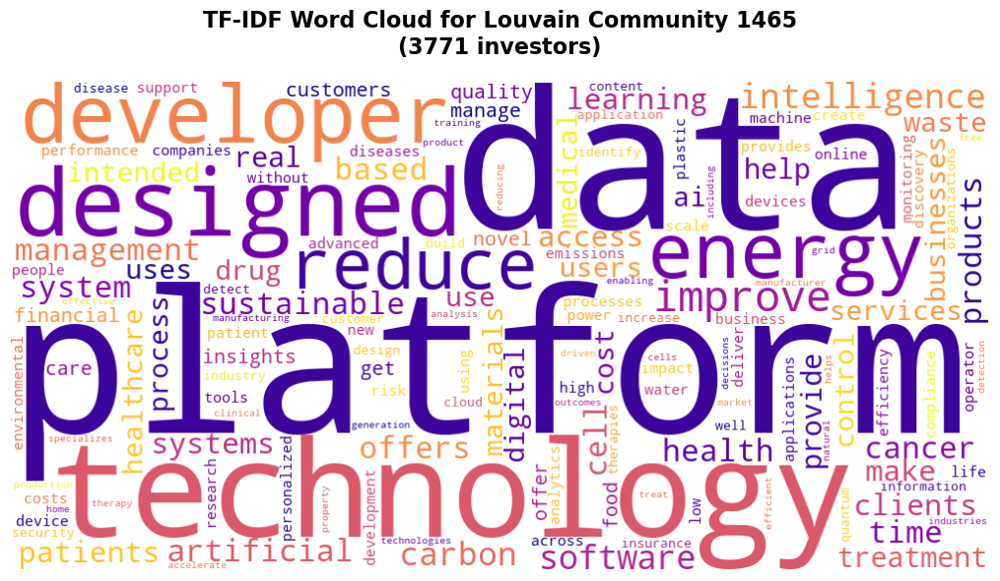


Louvain Community 1465:
Total unique words: 9743
Number of investors: 3771
Top 10 TF-IDF words: ['platform', 'data', 'technology', 'designed', 'developer', 'energy', 'reduce', 'improve', 'intelligence', 'software']
--------------------------------------------------------------------------------


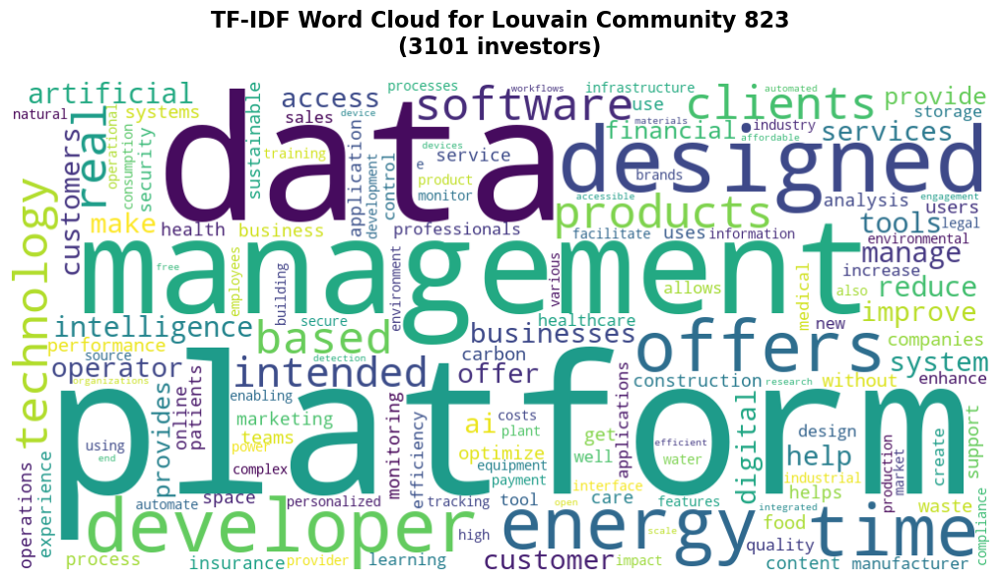


Louvain Community 823:
Total unique words: 8803
Number of investors: 3101
Top 10 TF-IDF words: ['platform', 'data', 'management', 'designed', 'developer', 'time', 'energy', 'offers', 'products', 'software']
--------------------------------------------------------------------------------


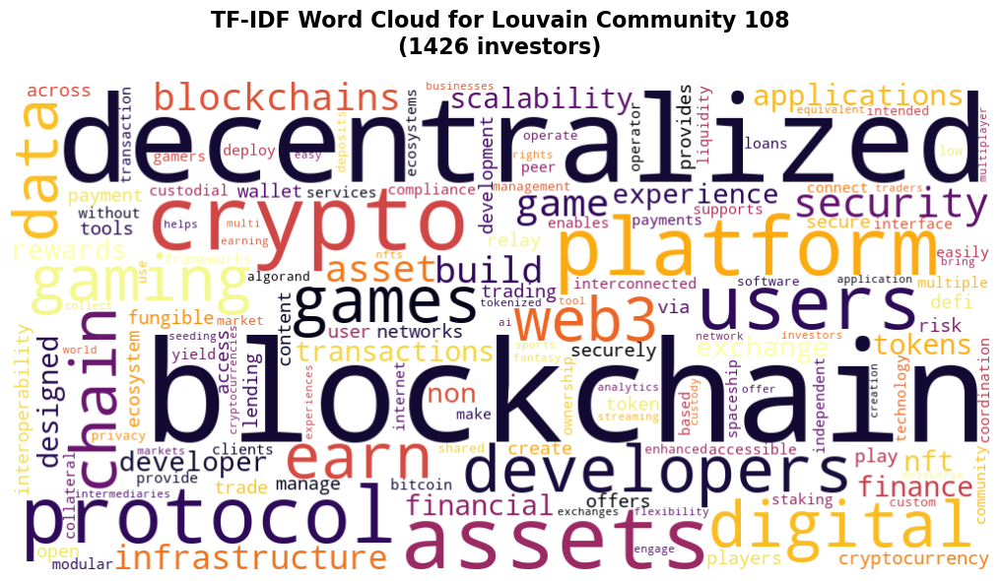


Louvain Community 108:
Total unique words: 3689
Number of investors: 1426
Top 10 TF-IDF words: ['blockchain', 'decentralized', 'crypto', 'assets', 'platform', 'protocol', 'users', 'developers', 'digital', 'games']
--------------------------------------------------------------------------------


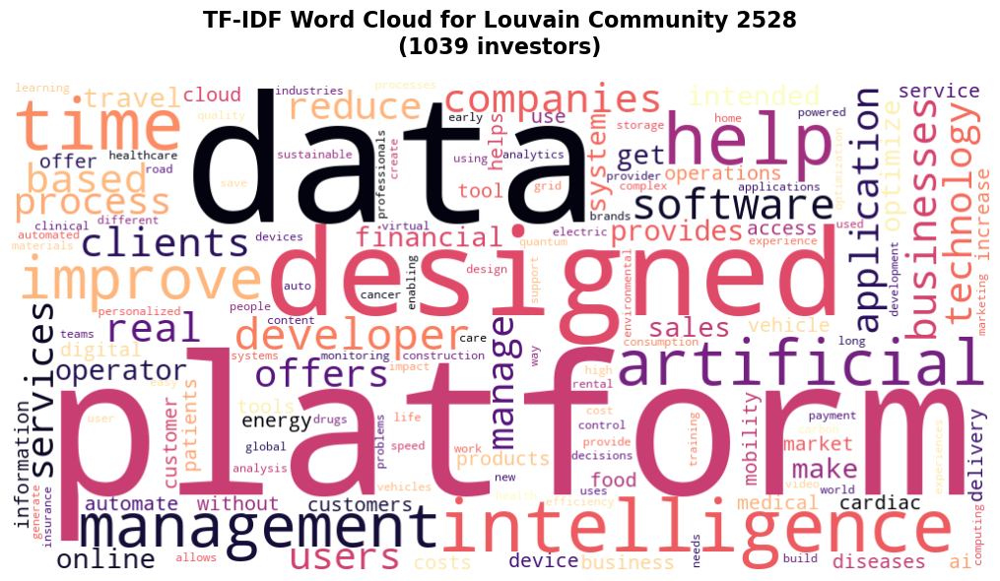


Louvain Community 2528:
Total unique words: 4799
Number of investors: 1039
Top 10 TF-IDF words: ['platform', 'data', 'designed', 'intelligence', 'help', 'time', 'artificial', 'management', 'improve', 'developer']
--------------------------------------------------------------------------------


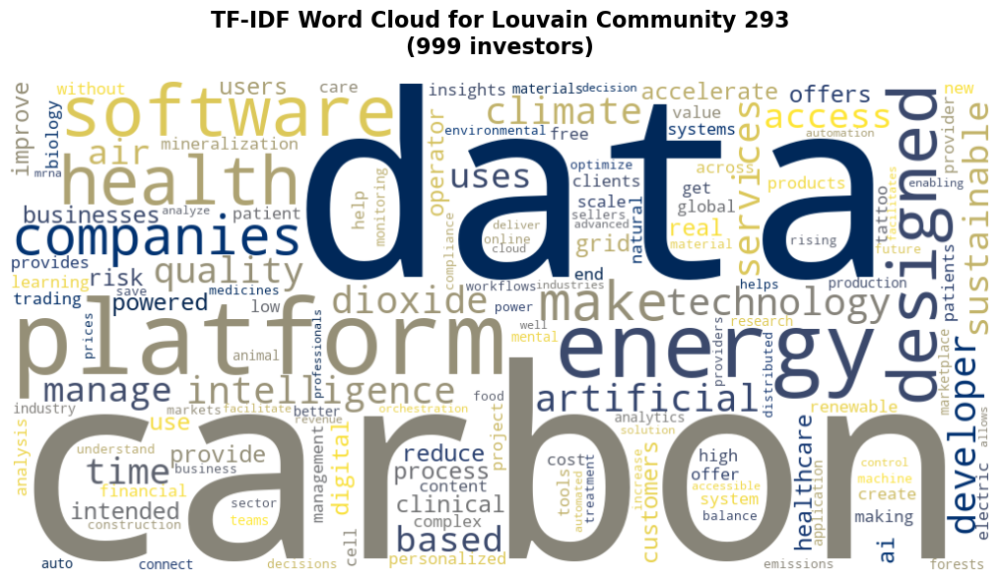


Louvain Community 293:
Total unique words: 5132
Number of investors: 999
Top 10 TF-IDF words: ['carbon', 'data', 'platform', 'energy', 'software', 'health', 'designed', 'companies', 'make', 'technology']
--------------------------------------------------------------------------------


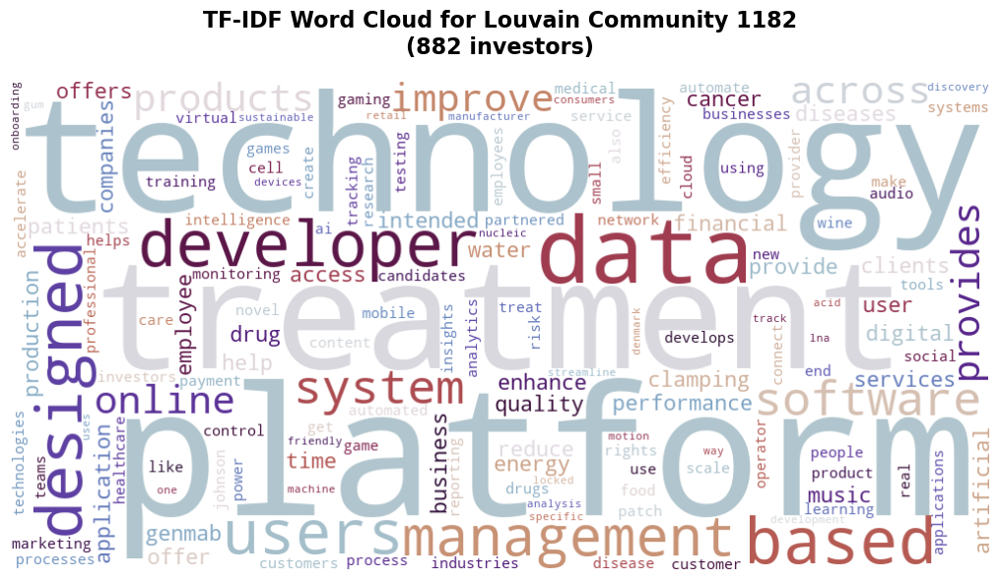


Louvain Community 1182:
Total unique words: 4813
Number of investors: 882
Top 10 TF-IDF words: ['platform', 'technology', 'treatment', 'data', 'developer', 'based', 'designed', 'users', 'management', 'system']
--------------------------------------------------------------------------------


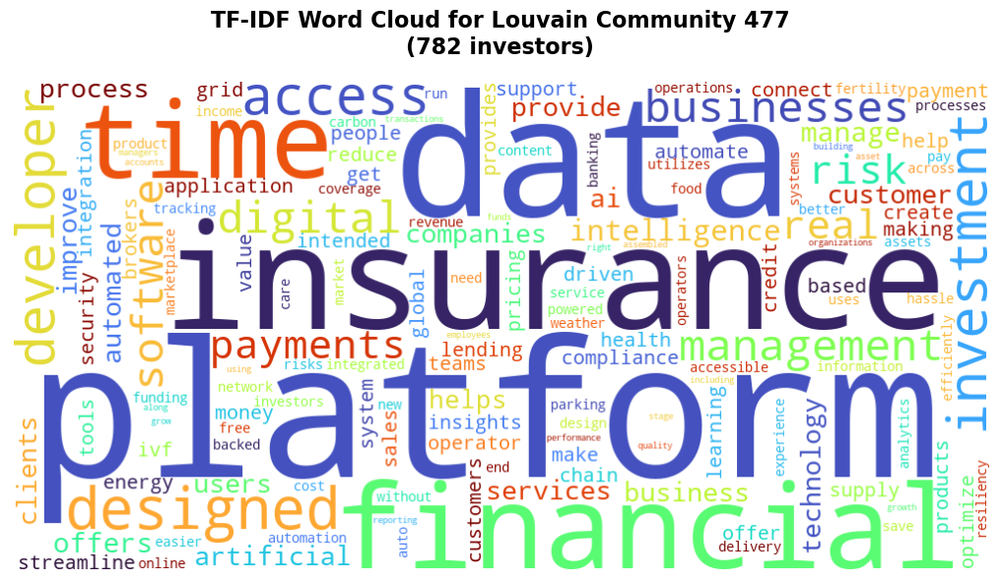


Louvain Community 477:
Total unique words: 4445
Number of investors: 782
Top 10 TF-IDF words: ['platform', 'data', 'insurance', 'financial', 'time', 'designed', 'investment', 'access', 'developer', 'management']
--------------------------------------------------------------------------------


In [71]:
def create_louvain_community_wordcloud(community_id, tf_idf_dict, community_index, community_size, colormap='plasma'):
    """
    Create a word cloud for a Louvain community using TF-IDF scores.
    
    Args:
        community_id: ID of the community (e.g., "louvain_comm_0")
        tf_idf_dict: TF-IDF scores for this community
        community_index: Index number of the community
        community_size: Number of investors in this community
        colormap: Color scheme for the word cloud
    """
    # Keep only positive TF-IDF values
    freqs = {w: float(v) for w, v in tf_idf_dict.items() if v > 0}
    if not freqs:
        print(f"No positive TF-IDF scores for community: {community_id}")
        return
    
    # Create WordCloud object
    wordcloud = WordCloud(
        width=1000,
        height=500,
        background_color='white',
        colormap=colormap,
        collocations=False,
        max_words=150,
        relative_scaling=0.6,
        random_state=42
    ).generate_from_frequencies(freqs)
    
    # Create the plot
    plt.figure(figsize=(12, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'TF-IDF Word Cloud for Louvain Community {community_index}\n({community_size} investors)', 
              fontsize=16, fontweight='bold', pad=20)
    plt.tight_layout()
    plt.show()
    
    # Print statistics
    top_tfidf = sorted(tf_idf_dict.items(), key=lambda x: x[1], reverse=True)[:10]
    print(f"\nLouvain Community {community_index}:")
    print(f"Total unique words: {len(tf_idf_dict)}")
    print(f"Number of investors: {community_size}")
    print(f"Top 10 TF-IDF words: {[word for word, _ in top_tfidf]}")
    print("-" * 80)

# Create word clouds for top 7 Louvain communities
print("\n" + "="*80)
print("CREATING TF-IDF WORD CLOUDS FOR TOP LOUVAIN COMMUNITIES")
print("="*80)

# Color schemes for variety
color_schemes = ['plasma', 'viridis', 'inferno', 'magma', 'cividis', 'twilight', 'turbo']

# Create word clouds for each top community
for i, (comm_index, comm_size) in enumerate(community_sizes[:7]):
    comm_id = f"louvain_comm_{comm_index}"
    if comm_id in louvain_tf_idf_scores:
        colormap = color_schemes[i % len(color_schemes)]
        create_louvain_community_wordcloud(
            comm_id, 
            louvain_tf_idf_scores[comm_id], 
            comm_index, 
            comm_size, 
            colormap
        )

### Comparison

In [73]:
def compare_industry_vs_louvain_tfidf(industry_tf_idf_scores, louvain_tf_idf_scores, 
                                     top_industries, top_communities_info):
    """
    Compare TF-IDF results between industry and Louvain communities.
    
    Args:
        industry_tf_idf_scores: TF-IDF scores for industries
        louvain_tf_idf_scores: TF-IDF scores for Louvain communities
        top_industries: List of top industries by size
        top_communities_info: List of (community_index, size) tuples
    """
    print("="*80)
    print("COMPARISON: INDUSTRY vs LOUVAIN COMMUNITY TF-IDF DISTINCTIVE WORDS")
    print("="*80)
    
    # Compare top 5 from each
    print("\nTOP DISTINCTIVE WORDS:")
    print("-" * 50)
    
    # Industries
    print("TOP 5 INDUSTRIES (by distinctive TF-IDF words):")
    for i, industry in enumerate(top_industries[:5], 1):
        if industry in industry_tf_idf_scores:
            top_words = sorted(industry_tf_idf_scores[industry].items(), 
                             key=lambda x: x[1], reverse=True)[:5]
            words_list = [word for word, _ in top_words]
            print(f"  {i}. {industry}: {words_list}")
    
    print("\nTOP 5 LOUVAIN COMMUNITIES (by distinctive TF-IDF words):")
    for i, (comm_idx, size) in enumerate(top_communities_info[:5], 1):
        comm_id = f"louvain_comm_{comm_idx}"
        if comm_id in louvain_tf_idf_scores:
            top_words = sorted(louvain_tf_idf_scores[comm_id].items(), 
                             key=lambda x: x[1], reverse=True)[:5]
            words_list = [word for word, _ in top_words]
            print(f"  {i}. Community {comm_idx} ({size} investors): {words_list}")
    
    # Calculate vocabulary overlap
    print("\n" + "="*60)
    print("VOCABULARY ANALYSIS:")
    print("="*60)
    
    # Get all words from each type of community
    industry_vocab = set()
    for industry in top_industries[:5]:
        if industry in industry_tf_idf_scores:
            industry_vocab.update(industry_tf_idf_scores[industry].keys())
    
    louvain_vocab = set()
    for comm_idx, _ in top_communities_info[:5]:
        comm_id = f"louvain_comm_{comm_idx}"
        if comm_id in louvain_tf_idf_scores:
            louvain_vocab.update(louvain_tf_idf_scores[comm_id].keys())
    
    # Calculate overlap
    common_words = industry_vocab & louvain_vocab
    industry_only = industry_vocab - louvain_vocab
    louvain_only = louvain_vocab - industry_vocab
    
    print(f"Industry communities vocabulary size: {len(industry_vocab)}")
    print(f"Louvain communities vocabulary size: {len(louvain_vocab)}")
    print(f"Common words: {len(common_words)}")
    print(f"Industry-only words: {len(industry_only)}")
    print(f"Louvain-only words: {len(louvain_only)}")
    print(f"Vocabulary overlap: {len(common_words) / len(industry_vocab | louvain_vocab) * 100:.1f}%")
    
    # Sample distinctive words
    print(f"\nSample industry-distinctive words: {list(industry_only)[:10]}")
    print(f"Sample Louvain-distinctive words: {list(louvain_only)[:10]}")

# Run the comparison
compare_industry_vs_louvain_tfidf(
    tf_idf_scores,  # industry TF-IDF scores from earlier
    louvain_tf_idf_scores,  # Louvain TF-IDF scores
    top_industries,  # top industries list from earlier
    community_sizes  # top communities info
)

COMPARISON: INDUSTRY vs LOUVAIN COMMUNITY TF-IDF DISTINCTIVE WORDS

TOP DISTINCTIVE WORDS:
--------------------------------------------------
TOP 5 INDUSTRIES (by distinctive TF-IDF words):
  1. Information Technology: ['barcodes', 'solitaire', 'homoglyph', 'ran', 'vacuuming']
  2. Healthcare: ['nash', 'inhibits', 'fibroids', 'genmab', 'steatohepatitis']
  3. Consumer Products and Services (B2C): ['nootropic', 'gummies', 'sicilian', 'dragon', 'pickled']
  4. Business Products and Services (B2B): ['titania', 'vinyl', 'hvdc', 'skies', 'vertiports']
  5. Financial Services: ['scouring', 'algorand', 'dex', 'democratise', 'validators']

TOP 5 LOUVAIN COMMUNITIES (by distinctive TF-IDF words):
  1. Community 1465 (3771 investors): ['platform', 'data', 'technology', 'designed', 'developer']
  2. Community 823 (3101 investors): ['platform', 'data', 'management', 'designed', 'developer']
  3. Community 108 (1426 investors): ['blockchain', 'decentralized', 'crypto', 'assets', 'platform']
  4. Co